<a href="https://colab.research.google.com/github/sabeesh90/Imputation_vs_Augmentation_Facial_Key_Point_Detection/blob/main/FKPD_Pratima_Sab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# COMMENCING LAZARUS

# Facial Keypoints Detection - Importing libraries
In this project will build model to detect the 15 facial keypoints (x,y co-ordinates) for a given facial image.

In [ ]:
!pip install keras-tuner

     |████████████████████████████████| 97 kB 2.9 MB/s 


In [ ]:
import tempfile

In [ ]:
import numpy as np
import pandas as pd
import os
import datetime
import os
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
from math import sin, cos, pi
import cv2
import tensorflow as tf
import tensorflow.keras as keras
import warnings
warnings.filterwarnings('ignore')
from tensorflow.keras.models import Sequential, Model, load_model
from keras.losses import mean_squared_error
from keras import backend as K
from tensorflow.keras.applications import NASNetMobile, MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Activation, Convolution2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout, Conv2D,MaxPool2D, ZeroPadding2D, GlobalAveragePooling2D
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint

In [ ]:
input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
mnet = MobileNetV2(weights='imagenet',include_top= False, input_tensor = input_layer)
mnet.trainable = True
output_layer = mnet(input_layer)
gap = GlobalAveragePooling2D()(output_layer)
out = Dense(30)(gap) 
mnet_model = Model(inputs=input_layer,outputs=out)

input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
input_resize = tf.keras.layers.experimental.preprocessing.Resizing(224,224)(input_layer)
nnet = NASNetMobile(weights='imagenet',include_top= False)
nnet.trainable = True
model_nnet = nnet(input_resize)
gap = GlobalAveragePooling2D()(model_nnet)
out = Dense(30)(gap) 
nnet_model = Model(inputs=input_layer,outputs=out)

20004864/19993432 [==============================] - 0s 0us/step


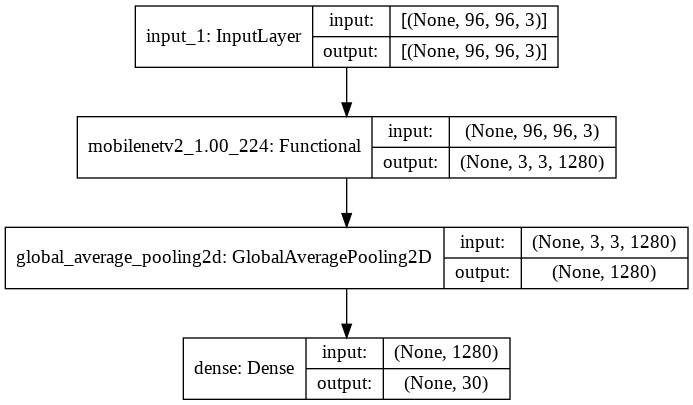

In [ ]:
keras.utils.plot_model(mnet_model, show_shapes = True)

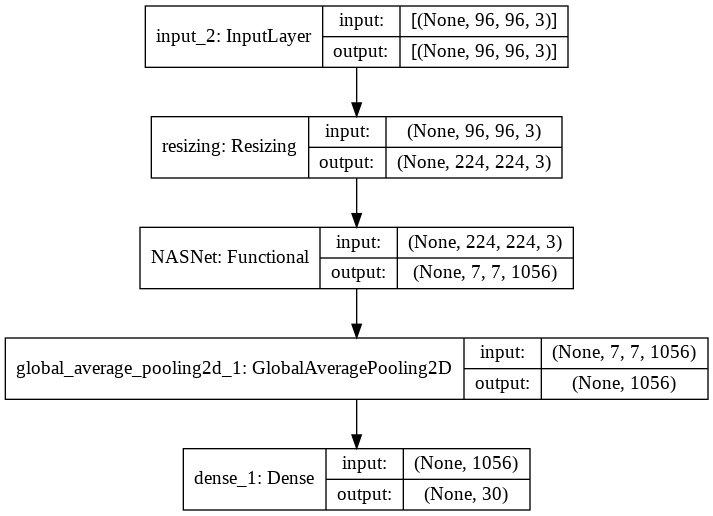

In [ ]:
keras.utils.plot_model(nnet_model, show_shapes = True)

# Exploratory data analysis

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd drive/MyDrive/Colab Notebooks/

/content/drive/MyDrive/Colab Notebooks


In [ ]:
%cd prathima_models/

/content/drive/MyDrive/Colab Notebooks/prathima_models


In [ ]:
# Read input files from path

train_path = "/content/drive/My Drive/Colab Notebooks/fkd_dataset/training.csv"
test_path = "/content/drive/My Drive/Colab Notebooks/fkd_dataset/test.csv"
train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

#train = pd.read_csv("/kaggle/input/training/training.csv")

In [ ]:
train_data.head(1)

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,right_eye_outer_corner_x,right_eye_outer_corner_y,left_eyebrow_inner_end_x,left_eyebrow_inner_end_y,left_eyebrow_outer_end_x,left_eyebrow_outer_end_y,right_eyebrow_inner_end_x,right_eyebrow_inner_end_y,right_eyebrow_outer_end_x,right_eyebrow_outer_end_y,nose_tip_x,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,23.452872,37.389402,56.953263,29.033648,80.227128,32.228138,40.227609,29.002322,16.356379,29.647471,44.420571,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...


In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7049 entries, 0 to 7048
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   left_eye_center_x          7039 non-null   float64
 1   left_eye_center_y          7039 non-null   float64
 2   right_eye_center_x         7036 non-null   float64
 3   right_eye_center_y         7036 non-null   float64
 4   left_eye_inner_corner_x    2271 non-null   float64
 5   left_eye_inner_corner_y    2271 non-null   float64
 6   left_eye_outer_corner_x    2267 non-null   float64
 7   left_eye_outer_corner_y    2267 non-null   float64
 8   right_eye_inner_corner_x   2268 non-null   float64
 9   right_eye_inner_corner_y   2268 non-null   float64
 10  right_eye_outer_corner_x   2268 non-null   float64
 11  right_eye_outer_corner_y   2268 non-null   float64
 12  left_eyebrow_inner_end_x   2270 non-null   float64
 13  left_eyebrow_inner_end_y   2270 non-null   float

In [ ]:
train_data.isnull().sum()

left_eye_center_x              10
left_eye_center_y              10
right_eye_center_x             13
right_eye_center_y             13
left_eye_inner_corner_x      4778
left_eye_inner_corner_y      4778
left_eye_outer_corner_x      4782
left_eye_outer_corner_y      4782
right_eye_inner_corner_x     4781
right_eye_inner_corner_y     4781
right_eye_outer_corner_x     4781
right_eye_outer_corner_y     4781
left_eyebrow_inner_end_x     4779
left_eyebrow_inner_end_y     4779
left_eyebrow_outer_end_x     4824
left_eyebrow_outer_end_y     4824
right_eyebrow_inner_end_x    4779
right_eyebrow_inner_end_y    4779
right_eyebrow_outer_end_x    4813
right_eyebrow_outer_end_y    4813
nose_tip_x                      0
nose_tip_y                      0
mouth_left_corner_x          4780
mouth_left_corner_y          4780
mouth_right_corner_x         4779
mouth_right_corner_y         4779
mouth_center_top_lip_x       4774
mouth_center_top_lip_y       4774
mouth_center_bottom_lip_x      33
mouth_center_b

# Without imputation


In [ ]:
# Discard the images/rows with missing values
train_15kp_data = train_data.dropna().reset_index()

In [ ]:
train_15kp_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2140 entries, 0 to 2139
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   index                      2140 non-null   int64  
 1   left_eye_center_x          2140 non-null   float64
 2   left_eye_center_y          2140 non-null   float64
 3   right_eye_center_x         2140 non-null   float64
 4   right_eye_center_y         2140 non-null   float64
 5   left_eye_inner_corner_x    2140 non-null   float64
 6   left_eye_inner_corner_y    2140 non-null   float64
 7   left_eye_outer_corner_x    2140 non-null   float64
 8   left_eye_outer_corner_y    2140 non-null   float64
 9   right_eye_inner_corner_x   2140 non-null   float64
 10  right_eye_inner_corner_y   2140 non-null   float64
 11  right_eye_outer_corner_x   2140 non-null   float64
 12  right_eye_outer_corner_y   2140 non-null   float64
 13  left_eyebrow_inner_end_x   2140 non-null   float

So, we have only 2140 images with 15 keypoints for training.

#3. With Imputation

In [ ]:
train_4kp_data = train_data.drop(['Image'], axis=1)
column_names = train_4kp_data.columns
# print(column_names)

In [ ]:
#imput missing data with knn imputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors = 5)
train_4kp_array = imputer.fit_transform(train_4kp_data)
print("unclean_train_data shape: {}\n".format(np.shape(train_4kp_data)))

unclean_train_data shape: (7049, 30)



In [ ]:
train_4kp_df = pd.DataFrame(train_4kp_array,columns=column_names)
train_4kp_df.head(2)

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,right_eye_outer_corner_x,right_eye_outer_corner_y,left_eyebrow_inner_end_x,left_eyebrow_inner_end_y,left_eyebrow_outer_end_x,left_eyebrow_outer_end_y,right_eyebrow_inner_end_x,right_eyebrow_inner_end_y,right_eyebrow_outer_end_x,right_eyebrow_outer_end_y,nose_tip_x,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,23.452872,37.389402,56.953263,29.033648,80.227128,32.228138,40.227609,29.002322,16.356379,29.647471,44.420571,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,24.472511,33.144443,53.987404,28.275949,78.634213,30.405923,42.728851,26.146043,16.865362,27.058860,48.206298,55.660936,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170


# forward fill imputation

In [ ]:
#imput missing data with knn imputer
train_8kp_data = train_data.drop(['Image'], axis=1)
train_8kp_data = train_8kp_data.fillna(method = 'ffill')

In [ ]:
train_8kp_data.isnull().sum(axis= 0)
# this is to check if the null values have been replaced with forward fill pass

left_eye_center_x            0
left_eye_center_y            0
right_eye_center_x           0
right_eye_center_y           0
left_eye_inner_corner_x      0
left_eye_inner_corner_y      0
left_eye_outer_corner_x      0
left_eye_outer_corner_y      0
right_eye_inner_corner_x     0
right_eye_inner_corner_y     0
right_eye_outer_corner_x     0
right_eye_outer_corner_y     0
left_eyebrow_inner_end_x     0
left_eyebrow_inner_end_y     0
left_eyebrow_outer_end_x     0
left_eyebrow_outer_end_y     0
right_eyebrow_inner_end_x    0
right_eyebrow_inner_end_y    0
right_eyebrow_outer_end_x    0
right_eyebrow_outer_end_y    0
nose_tip_x                   0
nose_tip_y                   0
mouth_left_corner_x          0
mouth_left_corner_y          0
mouth_right_corner_x         0
mouth_right_corner_y         0
mouth_center_top_lip_x       0
mouth_center_top_lip_y       0
mouth_center_bottom_lip_x    0
mouth_center_bottom_lip_y    0
dtype: int64

##Data Set Flag definition

In [ ]:
Flag_include_unclean_data = True    # Whether to include samples with missing keypoint values. Note that the missing values would however be filled using Pandas' 'ffill' later.

In [ ]:
# User Defined Functions
# To convert the image data from string to Array
def string_to_array(pd_series):
    '''
   
    returns 3d numpy array of shape of (num of images, 96, 96, 1).
    '''
    data_size = len(pd_series)
    #intialize output 3d array as numpy zeros array.
    X = np.zeros(shape=(data_size,96,96,1), dtype=np.float32)
    for i in tqdm(range(data_size)):
        img_str = pd_series[i]
        img_list = img_str.split(' ')
        img_array = np.array(img_list, dtype=np.float32)
        img_array = img_array.reshape(96,96,1)
        X[i] = img_array
    return X

# Function to plot Facial image with Keypoints
def display_faceimg_with_kps(fimg, kps):
    plt.imshow(fimg[:,:,0], cmap='gray')
    for i in range(1,31,2):
        plt.plot(kps[i-1], kps[i], 'g.')

def plot_sample(image, keypoint, axis, title):
    image = image.reshape(96,96)
    axis.imshow(image, cmap='gray')
    axis.scatter(keypoint[0::2], keypoint[1::2], marker='x', s=20)
    plt.title(title)


In [ ]:
# split labels into y_train
X_train_15kp = string_to_array(train_15kp_data['Image'])
labels_15kp =  train_15kp_data.drop(['index','Image'], axis=1)
y_train_15kp = labels_15kp.to_numpy(dtype=np.float32)
print('\nX_train 15kp shape : ', X_train_15kp.shape)
print('y_train 15kp shape: ', y_train_15kp.shape)

X_train = X_train_15kp # this is the pure datatset
y_train = y_train_15kp

## this is the knn imputed data
X_train_4kp = string_to_array(train_data['Image'])
y_train_4kp = train_4kp_df.to_numpy(dtype=np.float32)
print('\nX_train 4kp shape : ', X_train_4kp.shape)
print('y_train 4kp shape: ', y_train_4kp.shape)

# this is the forward fill imputed data
X_train_8kp = string_to_array(train_data['Image'])
y_train_8kp = train_8kp_data.to_numpy(dtype=np.float32)
print('\nX_train 8kp shape : ', X_train_8kp.shape)
print('y_train 8kp shape: ', y_train_8kp.shape)


100%|██████████| 2140/2140 [00:03<00:00, 569.13it/s]



X_train 15kp shape :  (2140, 96, 96, 1)
y_train 15kp shape:  (2140, 30)


100%|██████████| 7049/7049 [00:12<00:00, 555.01it/s]



X_train 4kp shape :  (7049, 96, 96, 1)
y_train 4kp shape:  (7049, 30)


100%|██████████| 7049/7049 [00:12<00:00, 562.60it/s]


X_train 8kp shape :  (7049, 96, 96, 1)
y_train 8kp shape:  (7049, 30)


In [ ]:
## for test data
X_test = string_to_array(test_data['Image'])
print('\nX_test shape : ', X_test.shape)

100%|██████████| 1783/1783 [00:03<00:00, 558.22it/s]


X_test shape :  (1783, 96, 96, 1)


In [ ]:
print(y_train_15kp.shape)
print(y_train_4kp.shape)
print(y_train_8kp.shape)

(2140, 30)
(7049, 30)
(7049, 30)


In [ ]:
Flag_include_unclean_data

True

In [ ]:
if Flag_include_unclean_data:
  # Concatenate 15kp data with the imputed 4kp data, to form the final dataset
  X_train_knn_impute = np.concatenate((X_train, X_train_4kp))
  y_train_knn_impute = np.concatenate((y_train, y_train_4kp))
  print('\nX_train shape : ', X_train_knn_impute.shape)
  print('y_train shape: ', y_train_knn_impute.shape)


if Flag_include_unclean_data:
  # Concatenate 15kp data with the imputed 4kp data, to form the final dataset
  X_train_ff_impute = np.concatenate((X_train, X_train_8kp))
  y_train_ff_impute = np.concatenate((y_train, y_train_8kp))
  print('\nX_train shape : ', X_train_ff_impute.shape)
  print('y_train shape: ', y_train_ff_impute.shape)


X_train shape :  (9189, 96, 96, 1)
y_train shape:  (9189, 30)

X_train shape :  (9189, 96, 96, 1)
y_train shape:  (9189, 30)


In [ ]:
X_train_knn_impute = X_train_knn_impute/255.0
X_train_ff_impute = X_train_ff_impute/255.0
X_train = X_train/255.0

In [ ]:
print(X_train[0][0][0])
print(X_train_knn_impute[0][0][0])
print(X_train_ff_impute[0][0][0])

[0.93333334]
[0.93333334]
[0.93333334]


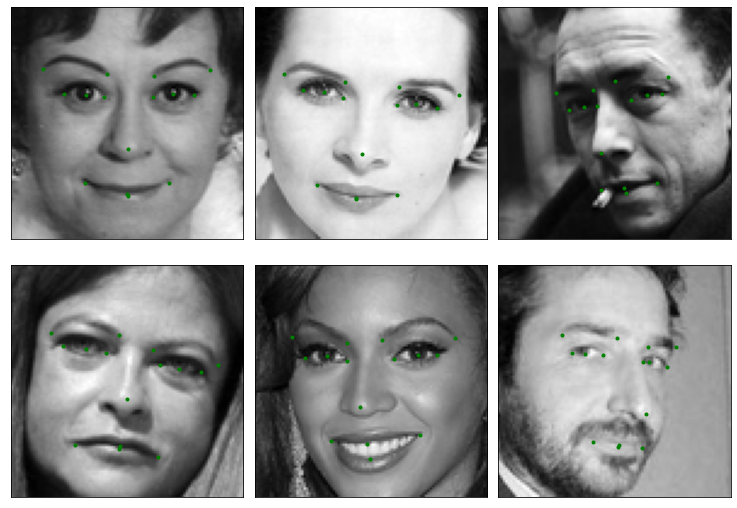

In [ ]:
#Function to display face images with KPs.
fig = plt.figure(figsize=(10, 7))
fig.subplots_adjust(
    left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)
import random
r = random.randint(1,2133)
for i in range(6):
    ax = fig.add_subplot(2, 3, i + 1, xticks=[], yticks=[])
    r = r+i
    display_faceimg_with_kps(X_train[r], y_train[r])

plt.show()

# DATA AUGMENTATION

In [ ]:
flag_rotation_augmentation = True
flag_brightness_augmentation = True
flag_shift_augmentation = True
flag_random_noise_augmentation = True
sample_image_index = 20    # Index of sample train image used for visualizing various augmentations
rotation_angles = [12]    # Rotation angle in degrees (includes both clockwise & anti-clockwise rotations)
pixel_shifts = [12]    # Horizontal & vertical shift amount in pixels (includes shift from all 4 corners)

### 3.1 Horizontal Flip


In [ ]:
# Reference : https://www.kaggle.com/balraj98/data-augmentation-for-facial-keypoint-detection
flag_horizontal_flip = False
def left_right_flip(images, keypoints):
    flipped_keypoints = []
    flipped_images = np.flip(images, axis=2)   # Flip column-wise (axis=2)
    for idx, sample_keypoints in enumerate(keypoints):
        flipped_keypoints.append([96.-coor if idx%2==0 else coor for idx,coor in enumerate(sample_keypoints)])    # Subtract only X co-ordinates of keypoints from 96 for horizontal flipping
    return flipped_images, flipped_keypoints

if flag_horizontal_flip:
    flipped_train_images, flipped_train_keypoints = left_right_flip(X_train_15kp, y_train_15kp)
    print("Shape of flipped_train_images: {}".format(np.shape(flipped_train_images)))
    print("Shape of flipped_train_keypoints: {}".format(np.shape(flipped_train_keypoints)))
    X_train_aug = np.concatenate((X_train, flipped_train_images))
    y_train_aug = np.concatenate((y_train, flipped_train_keypoints))
    fig, axis = plt.subplots()
    plot_sample(flipped_train_images[sample_image_index], flipped_train_keypoints[sample_image_index], axis, "Horizontally Flipped") 


### 3.2 Rotation Augmentation

Augmenting for angles (in degrees): 
12  -12  
Shape of rotated_train_images: (4280, 96, 96, 1)
Shape of rotated_train_keypoints: (4280, 30)



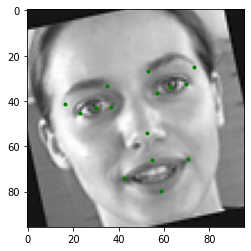

In [ ]:
def rotate_augmentation(images, keypoints):
    rotated_images = []
    rotated_keypoints = []
    print("Augmenting for angles (in degrees): ")
    for angle in rotation_angles:    # Rotation augmentation for a list of angle values
        for angle in [angle,-angle]:
            print(f'{angle}', end='  ')
            M = cv2.getRotationMatrix2D((48,48), angle, 1.0)
            angle_rad = -angle*pi/180.     # Obtain angle in radians from angle in degrees (notice negative sign for change in clockwise vs anti-clockwise directions from conventional rotation to cv2's image rotation)
            # For train_images
            for image in images:
                rotated_image = cv2.warpAffine(image, M, (96,96), flags=cv2.INTER_CUBIC)
                rotated_images.append(rotated_image)
            # For train_keypoints
            for keypoint in keypoints:
                rotated_keypoint = keypoint - 48.    # Subtract the middle value of the image dimension
                for idx in range(0,len(rotated_keypoint),2):
                    # https://in.mathworks.com/matlabcentral/answers/93554-how-can-i-rotate-a-set-of-points-in-a-plane-by-a-certain-angle-about-an-arbitrary-point
                    rotated_keypoint[idx] = rotated_keypoint[idx]*cos(angle_rad)-rotated_keypoint[idx+1]*sin(angle_rad)
                    rotated_keypoint[idx+1] = rotated_keypoint[idx]*sin(angle_rad)+rotated_keypoint[idx+1]*cos(angle_rad)
                rotated_keypoint += 48.   # Add the earlier subtracted value
                rotated_keypoints.append(rotated_keypoint)
            
    return np.reshape(rotated_images,(-1,96,96,1)), rotated_keypoints

if flag_rotation_augmentation:
    rotated_train_images, rotated_train_keypoints = rotate_augmentation(X_train_15kp, y_train_15kp)
    print("\nShape of rotated_train_images: {}".format(np.shape(rotated_train_images)))
    print("Shape of rotated_train_keypoints: {}\n".format(np.shape(rotated_train_keypoints)))
    X_train_aug = np.concatenate((X_train, rotated_train_images))
    y_train_aug = np.concatenate((y_train, rotated_train_keypoints))
    fig, axis = plt.subplots()
    display_faceimg_with_kps(rotated_train_images[sample_image_index], rotated_train_keypoints[sample_image_index])
    #plot_sample(, axis, "Rotation Augmentation")

### 3.3 Brightness Alteration

Shape of altered_brightness_train_images: (4280, 96, 96, 1)
Shape of altered_brightness_train_keypoints: (4280, 30)


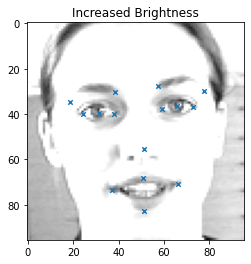

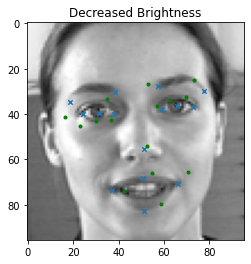

In [ ]:
def alter_brightness(images, keypoints):
    altered_brightness_images = []
    inc_brightness_images = np.clip(images*0.0070, 0.0, 1.0)    # Increased brightness by a factor of 1.2 & clip any values outside the range of [-1,1]
    dec_brightness_images = np.clip(images*0.0020, 0.0, 1.0)    # Decreased brightness by a factor of 0.6 & clip any values outside the range of [-1,1]
    altered_brightness_images.extend(inc_brightness_images)
    altered_brightness_images.extend(dec_brightness_images)
    return altered_brightness_images, np.concatenate((keypoints, keypoints))

if flag_brightness_augmentation:
  altered_brightness_train_images, altered_brightness_train_keypoints = alter_brightness(X_train_15kp, y_train_15kp)
  print(f"Shape of altered_brightness_train_images: {np.shape(altered_brightness_train_images)}")
  print(f"Shape of altered_brightness_train_keypoints: {np.shape(altered_brightness_train_keypoints)}")
  X_train_aug = np.concatenate((X_train_aug, altered_brightness_train_images))
  y_train_aug = np.concatenate((y_train_aug, altered_brightness_train_keypoints))
  fig, axis = plt.subplots()
  plot_sample(altered_brightness_train_images[sample_image_index], altered_brightness_train_keypoints[sample_image_index], axis, "Increased Brightness") 
  fig, axis = plt.subplots()
  display_faceimg_with_kps(rotated_train_images[sample_image_index], rotated_train_keypoints[sample_image_index])
  plot_sample(altered_brightness_train_images[len(altered_brightness_train_images)//2+sample_image_index], altered_brightness_train_keypoints[len(altered_brightness_train_images)//2+sample_image_index], axis, "Decreased Brightness") 


### 3.4 Horizontal and Vertical Shift

Shape of shifted_train_images: (6350, 96, 96, 1)
Shape of shifted_train_keypoints: (6350, 30)


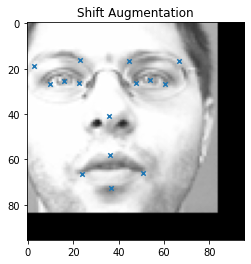

In [ ]:
def shift_images(images, keypoints):
    shifted_images = []
    shifted_keypoints = []
    for shift in pixel_shifts:    # Augmenting over several pixel shift values
        for (shift_x,shift_y) in [(-shift,-shift),(-shift,shift),(shift,-shift),(shift,shift)]:
            M = np.float32([[1,0,shift_x],[0,1,shift_y]])
            for image, keypoint in zip(images, keypoints):
                shifted_image = cv2.warpAffine(image, M, (96,96), flags=cv2.INTER_CUBIC)
                shifted_keypoint = np.array([(point+shift_x) if idx%2==0 else (point+shift_y) for idx, point in enumerate(keypoint)])
                if np.all(0.0<shifted_keypoint) and np.all(shifted_keypoint<96.0):
                    shifted_images.append(shifted_image.reshape(96,96,1))
                    shifted_keypoints.append(shifted_keypoint)
    shifted_keypoints = np.clip(shifted_keypoints,0.0,96.0)
    return shifted_images, shifted_keypoints

if flag_shift_augmentation:
    shifted_train_images, shifted_train_keypoints = shift_images(X_train_15kp, y_train_15kp)
    print(f"Shape of shifted_train_images: {np.shape(shifted_train_images)}")
    print(f"Shape of shifted_train_keypoints: {np.shape(shifted_train_keypoints)}")
    X_train_aug = np.concatenate((X_train_aug, shifted_train_images))
    y_train_aug = np.concatenate((y_train_aug, shifted_train_keypoints))
    fig, axis = plt.subplots()
    plot_sample(shifted_train_images[sample_image_index], shifted_train_keypoints[sample_image_index], axis, "Shift Augmentation")

### 3.5 Random Noise Augmentation

Shape of noisy_train_images: (2140, 96, 96, 1)


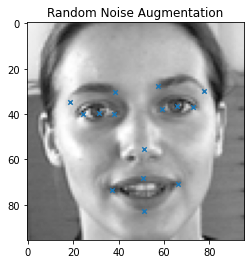

In [ ]:
def add_noise(images):
    noisy_images = []
    for image in images:
        noisy_image = cv2.add(image, 0.008*np.random.randn(96,96,1),dtype=cv2.CV_32F)    # Adding random normal noise to the input image & clip the resulting noisy image between [-1,1]
        noisy_images.append(noisy_image.reshape(96,96,1))
    return noisy_images

if flag_random_noise_augmentation:
    noisy_train_images = add_noise(X_train_15kp)
    print(f"Shape of noisy_train_images: {np.shape(noisy_train_images)}")
    X_train_aug = np.concatenate((X_train_aug, noisy_train_images))
    y_train_aug = np.concatenate((y_train_aug, y_train_15kp))
    fig, axis = plt.subplots()
    plot_sample(noisy_train_images[sample_image_index], y_train_15kp[sample_image_index], axis, "Random Noise Augmentation")

### Visualize train images after augmentation

Shape of final train_images: (19190, 96, 96, 1)
Shape of final train_keypoints: (19190, 30)

 Clean Train Data: 


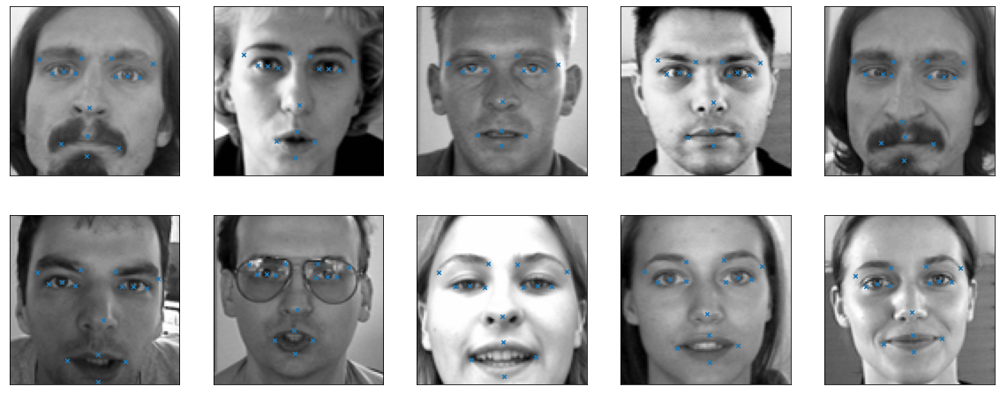

Unclean Train Data: 


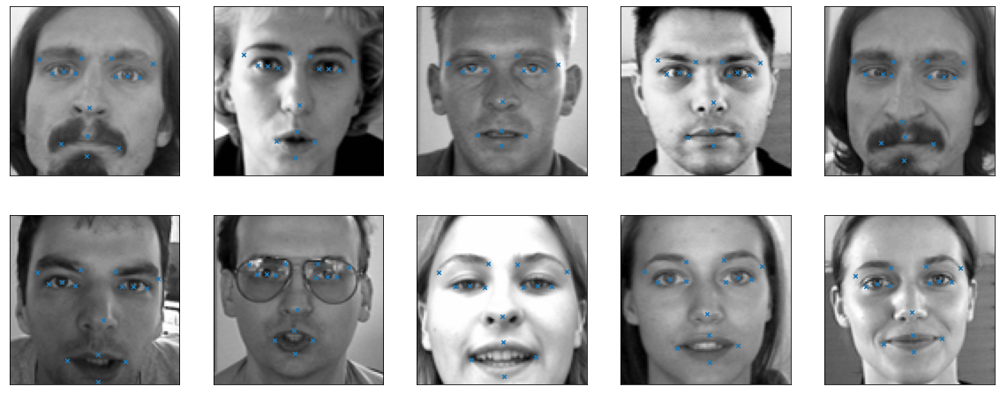

Rotation Augmentation: 


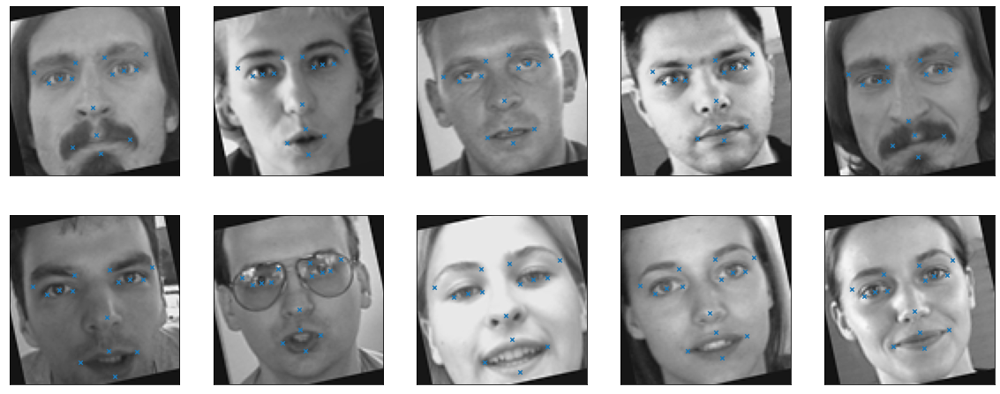

Brightness Augmentation: 


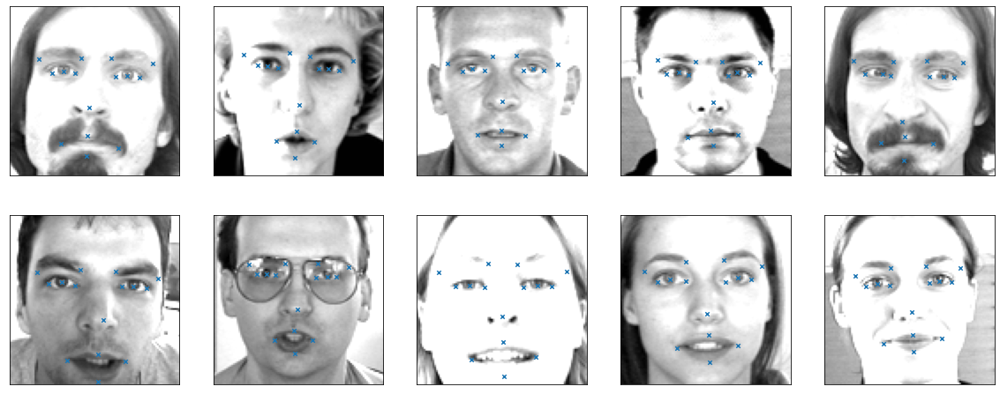

Shift Augmentation: 


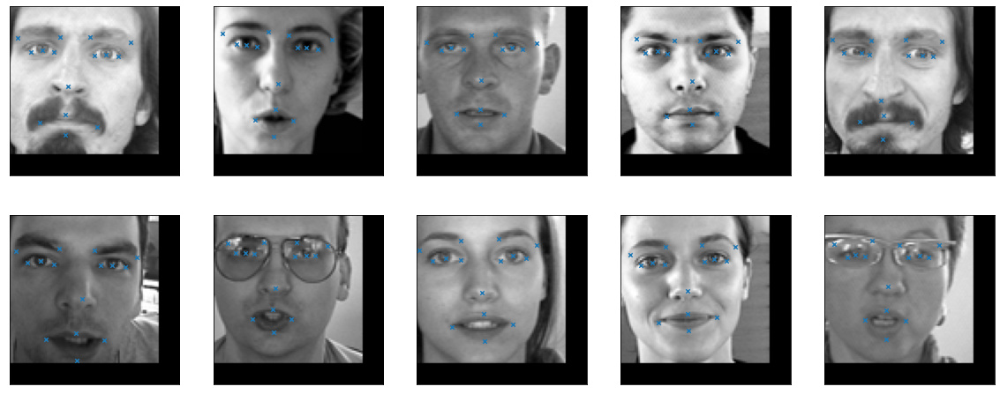

Random Noise Augmentation: 


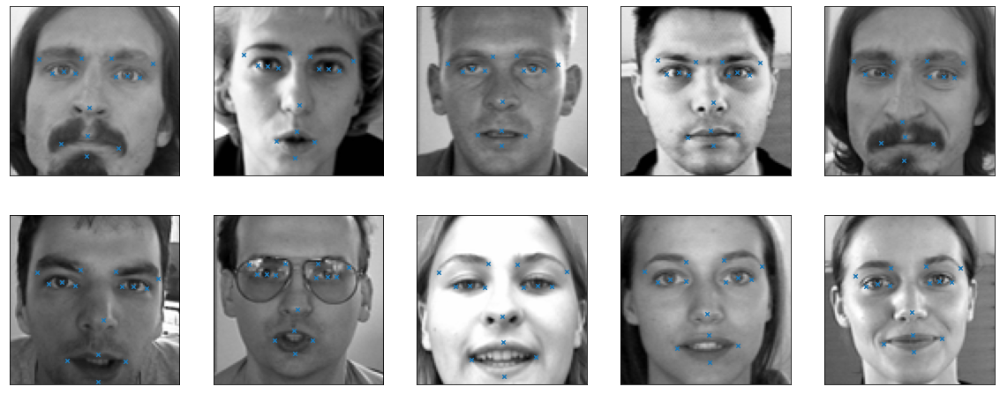

In [ ]:
print("Shape of final train_images: {}".format(np.shape(X_train_aug)))
print("Shape of final train_keypoints: {}".format(np.shape(y_train_aug)))

print("\n Clean Train Data: ")
fig = plt.figure(figsize=(20,8))
for i in range(10):
    axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
    plot_sample(X_train_15kp[i], y_train_15kp[i], axis, "")
plt.show()

if Flag_include_unclean_data:
    print("Unclean Train Data: ")
    fig = plt.figure(figsize=(20,8))
    for i in range(10):
        axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
        plot_sample(X_train_4kp[i], y_train_4kp[i], axis, "")
    plt.show()

if flag_horizontal_flip:
    print("Horizontal Flip Augmentation: ")
    fig = plt.figure(figsize=(20,8))
    for i in range(10):
        axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
        plot_sample(flipped_train_images[i], flipped_train_keypoints[i], axis, "")
    plt.show()

if flag_rotation_augmentation:
    print("Rotation Augmentation: ")
    fig = plt.figure(figsize=(20,8))
    for i in range(10):
        axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
        plot_sample(rotated_train_images[i], rotated_train_keypoints[i], axis, "")
    plt.show()
    
if flag_brightness_augmentation:
    print("Brightness Augmentation: ")
    fig = plt.figure(figsize=(20,8))
    for i in range(10):
        axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
        plot_sample(altered_brightness_train_images[i], altered_brightness_train_keypoints[i], axis, "")
    plt.show()

if flag_shift_augmentation:
    print("Shift Augmentation: ")
    fig = plt.figure(figsize=(20,8))
    for i in range(10):
        axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
        plot_sample(shifted_train_images[i], shifted_train_keypoints[i], axis, "")
    plt.show()
    
if flag_random_noise_augmentation:
    print("Random Noise Augmentation: ")
    fig = plt.figure(figsize=(20,8))
    for i in range(10):
        axis = fig.add_subplot(2, 5, i+1, xticks=[], yticks=[])
        plot_sample(noisy_train_images[i], y_train_15kp[i], axis, "")
    plt.show()

#Custom baseline model  -nil imputation

In [ ]:
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential, Model
from keras.layers import Activation, Convolution2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout, Conv2D,MaxPool2D, ZeroPadding2D, GlobalAveragePooling2D
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint

In [ ]:
model_p1 = Sequential()

model_p1.add(Convolution2D(32, (3,3), padding='same', use_bias=False, input_shape=(96,96,1)))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(32, (3,3), padding='same', use_bias=False, input_shape=(96,96,1)))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(48, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(48, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))


model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(80, (3,3),padding='same',use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(80, (3,3),padding='same',use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(GlobalAveragePooling2D())
model_p1.add(Dense(128, activation = 'relu'))
model_p1.add(Dense(30))
model_p1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 96, 96, 32)        288       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_16 (Batc (None, 96, 96, 32)        128       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 96, 96, 32)        9216      
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_17 (Batc (None, 96, 96, 32)        128       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 48, 48, 32)       

In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_simple_cnn.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]

In [ ]:
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train,y_train,batch_size=256, epochs=400, validation_split=0.10, callbacks=callbacks_list)

Epoch 1/400
8/8 [==============================] - 2s 118ms/step - loss: 2564.0664 - rmse: 50.6366 - val_loss: 2648.7898 - val_rmse: 51.4664

Epoch 00001: val_rmse improved from inf to 51.46639, saving model to prathima_models/best_model_simple_cnn.hdf5
Epoch 2/400
8/8 [==============================] - 1s 92ms/step - loss: 2427.5867 - rmse: 49.2705 - val_loss: 2633.9761 - val_rmse: 51.3223

Epoch 00002: val_rmse improved from 51.46639 to 51.32227, saving model to prathima_models/best_model_simple_cnn.hdf5
Epoch 3/400
8/8 [==============================] - 1s 92ms/step - loss: 2219.0603 - rmse: 47.1069 - val_loss: 2613.2561 - val_rmse: 51.1200

Epoch 00003: val_rmse improved from 51.32227 to 51.12002, saving model to prathima_models/best_model_simple_cnn.hdf5
Epoch 4/400
8/8 [==============================] - 1s 92ms/step - loss: 1870.2589 - rmse: 43.2465 - val_loss: 2586.1545 - val_rmse: 50.8542

Epoch 00004: val_rmse improved from 51.12002 to 50.85425, saving model to prathima_models

In [ ]:
baseline_cnn_model = load_model('prathima_models/best_model_simple_cnn.hdf5')

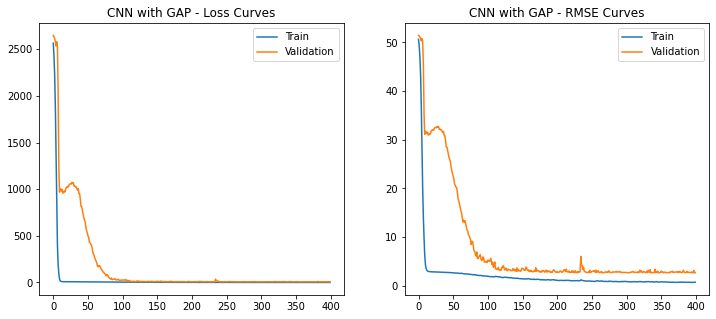

In [ ]:
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('CNN with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('CNN with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()

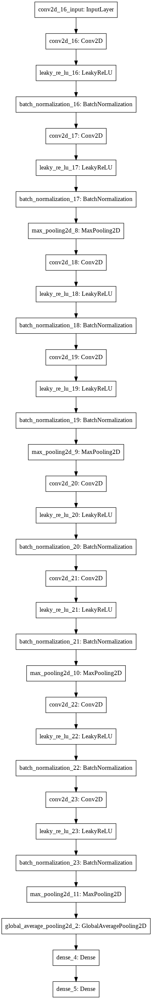

In [ ]:
keras.utils.plot_model(model_p1)

In [ ]:
  keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
  tf.keras.models.save_model(baseline_cnn_model, keras_file, include_optimizer=False)
  print('Saved baseline model to:', keras_file)
  model_size = round(os.path.getsize(keras_file)/1000000,2)
  print(model_size)

Saved baseline model to: /tmp/tmpi13j4kcq.h5
1.0


# KERAS TUNER CUSTOM MODEL

In [ ]:
def build_model(hp):
  model_p2 = Sequential([
  # FIRST Convoltional block
    keras.layers.Conv2D(
        filters = hp.Int('conv_1_filter',min_value=20,max_value=40,step=4),
        kernel_size = hp.Choice('conv_1_kernel', values = [3]),
        activation = 'relu',
        input_shape = (96,96,1)
    ),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(
        filters = hp.Int('conv_2_filter',min_value=20,max_value=40,step=4),
        kernel_size = hp.Choice('conv_2_kernel', values = [3]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),
    # keras.layers.MaxPool2D(pool_size=(2,2)),

# second convolutional block
    keras.layers.Conv2D(
        filters = hp.Int('conv_3_filter',min_value=36,max_value=60,step=4),
        kernel_size = hp.Choice('conv_3_kernel', values = [3]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(
        filters = hp.Int('conv_4_filter',min_value=36,max_value=60,step=4),
        kernel_size = hp.Choice('conv_4_kernel', values = [3]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2)),
# third convolutional block
    keras.layers.Conv2D(
        filters = hp.Int('conv_3_filter',min_value=52,max_value=76,step=4),
        kernel_size = hp.Choice('conv_3_kernel', values = [3]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(
        filters = hp.Int('conv_4_filter',min_value=52,max_value=76,step=4),
        kernel_size = hp.Choice('conv_4_kernel', values = [3]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2)),

# fourth convolutional block
    keras.layers.Conv2D(
        filters = hp.Int('conv_3_filter',min_value=68,max_value=92,step=4),
        kernel_size = hp.Choice('conv_3_kernel', values = [3]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(
        filters = hp.Int('conv_4_filter',min_value=68,max_value=92,step=4),
        kernel_size = hp.Choice('conv_4_kernel', values = [3]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),

   
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dense(
        units = hp.Int('dense_1_units',min_value=64,max_value=256,step=64),
        activation = 'relu'
    ),
    keras.layers.Dense(30)
  ])

  model_p2.compile(optimizer = keras.optimizers.Adam(hp.Choice('learning_rate',values=[1e-2])),loss = tf.keras.losses.mean_squared_error, 
                   metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])

  return model_p2
  

In [ ]:
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
import kerastuner as kt

objective = kt.Objective("val_rmse",direction="min")
tuner_search = RandomSearch(build_model,objective=objective,max_trials=5,directory='output',project_name='fkpd_tuned212')
tuner_search.search(X_train,y_train,epochs=5,validation_split=0.1)
model_SCNN = tuner_search.get_best_models(num_models=1)[0]

Trial 5 Complete [00h 00m 10s]
val_rmse: 4.555727481842041

Best val_rmse So Far: 4.101354598999023
Total elapsed time: 00h 00m 50s
INFO:tensorflow:Oracle triggered exit


In [ ]:
model_SCNN.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 94, 94, 24)        240       
_________________________________________________________________
batch_normalization (BatchNo (None, 94, 94, 24)        96        
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 92, 92, 32)        6944      
_________________________________________________________________
batch_normalization_1 (Batch (None, 92, 92, 32)        128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 90, 90, 40)        11560     
_________________________________________________________________
batch_normalization_2 (Batch (None, 90, 90, 40)        160       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 88, 88, 44)        1

In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_simple_cnn_kerastuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_SCNN.fit(X_train,y_train,batch_size=256, epochs=400, validation_split=0.10, callbacks=callbacks_list)

Epoch 1/400
8/8 [==============================] - 6s 423ms/step - loss: 9.6813 - rmse: 3.1115 - val_loss: 17.3798 - val_rmse: 4.1689

Epoch 00001: val_rmse improved from inf to 4.16891, saving model to prathima_models/best_model_simple_cnn_kerastuned.hdf5
Epoch 2/400
8/8 [==============================] - 1s 150ms/step - loss: 9.4496 - rmse: 3.0740 - val_loss: 17.2703 - val_rmse: 4.1558

Epoch 00002: val_rmse improved from 4.16891 to 4.15575, saving model to prathima_models/best_model_simple_cnn_kerastuned.hdf5
Epoch 3/400
8/8 [==============================] - 1s 151ms/step - loss: 9.3421 - rmse: 3.0565 - val_loss: 18.3777 - val_rmse: 4.2869

Epoch 00003: val_rmse did not improve from 4.15575
Epoch 4/400
8/8 [==============================] - 1s 151ms/step - loss: 9.3031 - rmse: 3.0501 - val_loss: 17.3959 - val_rmse: 4.1708

Epoch 00004: val_rmse did not improve from 4.15575
Epoch 5/400
8/8 [==============================] - 1s 151ms/step - loss: 9.2057 - rmse: 3.0341 - val_loss: 16.

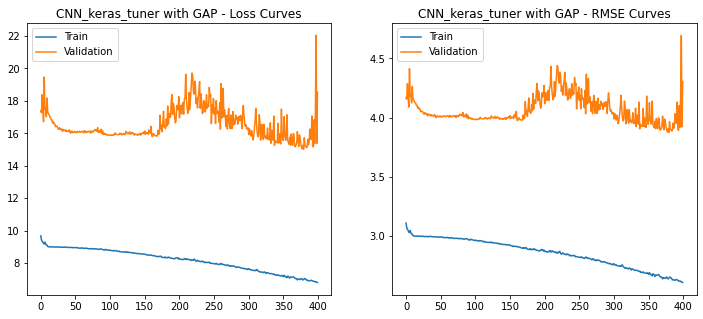

In [ ]:
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_SCNN.history.history['loss'])
plt.plot(model_SCNN.history.history['val_loss'])
plt.title('CNN_keras_tuner with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_SCNN.history.history['rmse'])
plt.plot(model_SCNN.history.history['val_rmse'])
plt.title('CNN_keras_tuner with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()

In [ ]:
  keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
  tf.keras.models.save_model(model_SCNN, keras_file, include_optimizer=False)
  print('Saved baseline model to:', keras_file)
  model_size = round(os.path.getsize(keras_file)/1000000,2)
  print(model_size)

Saved baseline model to: /tmp/tmpgdose3lj.h5
0.55


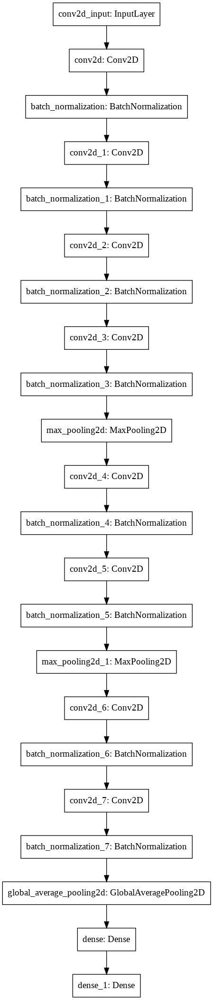

In [ ]:
keras.utils.plot_model(model_SCNN)

# Custom baseline model  - forward fill

In [ ]:
model_p1 = Sequential()

model_p1.add(Convolution2D(32, (3,3), padding='same', use_bias=False, input_shape=(96,96,1)))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(32, (3,3), padding='same', use_bias=False, input_shape=(96,96,1)))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(48, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(48, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))


model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(80, (3,3),padding='same',use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(80, (3,3),padding='same',use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(GlobalAveragePooling2D())
model_p1.add(Dense(128, activation = 'relu'))
model_p1.add(Dense(30))
model_p1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 96, 96, 32)        288       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_16 (Batc (None, 96, 96, 32)        128       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 96, 96, 32)        9216      
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_17 (Batc (None, 96, 96, 32)        128       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 48, 48, 32)       

In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_simple_cnn_ff.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train_ff_impute,y_train_ff_impute,batch_size=256, epochs=125, validation_split=0.10, callbacks=callbacks_list)

Epoch 1/125
33/33 [==============================] - 7s 186ms/step - loss: 2250.3491 - rmse: 47.4378 - val_loss: 2639.8018 - val_rmse: 51.3790

Epoch 00001: val_rmse improved from inf to 51.37900, saving model to prathima_models/best_model_simple_cnn_ff_new_trial1.hdf5
Epoch 2/125
33/33 [==============================] - 6s 181ms/step - loss: 579.1119 - rmse: 24.0647 - val_loss: 2209.4736 - val_rmse: 47.0050

Epoch 00002: val_rmse improved from 51.37900 to 47.00504, saving model to prathima_models/best_model_simple_cnn_ff_new_trial1.hdf5
Epoch 3/125
33/33 [==============================] - 6s 182ms/step - loss: 27.2246 - rmse: 5.2177 - val_loss: 1092.6741 - val_rmse: 33.0556

Epoch 00003: val_rmse improved from 47.00504 to 33.05562, saving model to prathima_models/best_model_simple_cnn_ff_new_trial1.hdf5
Epoch 4/125
33/33 [==============================] - 6s 182ms/step - loss: 10.2967 - rmse: 3.2088 - val_loss: 1105.0112 - val_rmse: 33.2417

Epoch 00004: val_rmse did not improve from 

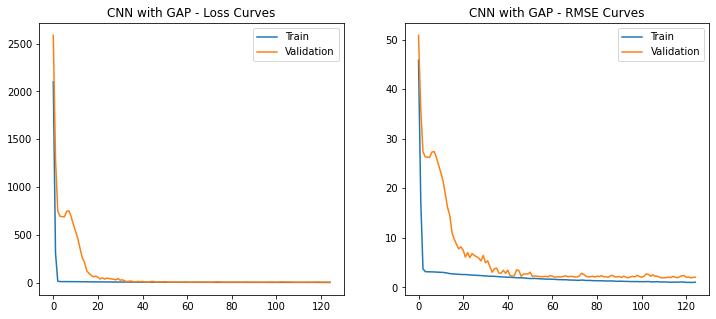

In [ ]:
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('CNN with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('CNN with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()

In [ ]:
baseline_cnn_model_ff = load_model('prathima_models/best_model_simple_cnn_ff.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Saved baseline model to: /tmp/tmp123xgdqv.h5
1.0


# Custom baseline model - KNN imputation

In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_simple_cnn_knn.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train_knn_impute,y_train_knn_impute,batch_size=256, epochs=125, validation_split=0.10, callbacks=callbacks_list)

Epoch 1/125
33/33 [==============================] - 7s 182ms/step - loss: 2219.7065 - rmse: 47.1138 - val_loss: 2542.6086 - val_rmse: 50.4243

Epoch 00001: val_rmse improved from inf to 50.42428, saving model to prathima_models/best_model_simple_cnn_knn.hdf5
Epoch 2/125
33/33 [==============================] - 6s 177ms/step - loss: 514.1860 - rmse: 22.6757 - val_loss: 1218.2626 - val_rmse: 34.9036

Epoch 00002: val_rmse improved from 50.42428 to 34.90362, saving model to prathima_models/best_model_simple_cnn_knn.hdf5
Epoch 3/125
33/33 [==============================] - 6s 178ms/step - loss: 23.9270 - rmse: 4.8915 - val_loss: 1068.2025 - val_rmse: 32.6834

Epoch 00003: val_rmse improved from 34.90362 to 32.68337, saving model to prathima_models/best_model_simple_cnn_knn.hdf5
Epoch 4/125
33/33 [==============================] - 6s 178ms/step - loss: 10.9492 - rmse: 3.3090 - val_loss: 907.2159 - val_rmse: 30.1200

Epoch 00004: val_rmse improved from 32.68337 to 30.12002, saving model to 

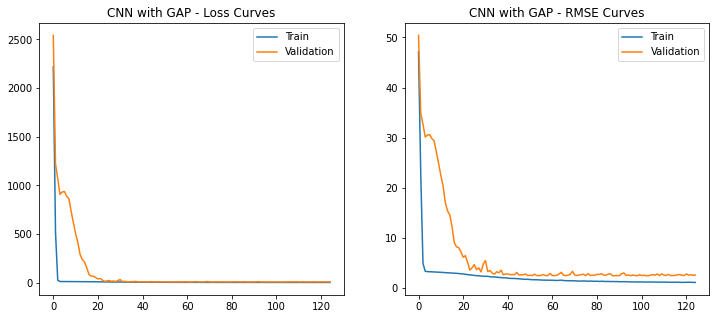

In [ ]:
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('CNN with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('CNN with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()

In [ ]:
baseline_cnn_model_ff = load_model('prathima_models/best_model_simple_cnn_knn.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Saved baseline model to: /tmp/tmpcfl59kf2.h5
1.0


# Custom based model - Optimization of CNN

# MOBILENET AND NASNET BUILDING

In [ ]:
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

val_split = 0.2
train_rgb, val_rgb, y_train_rgb, y_val_rgb = train_test_split(X_train, y_train, test_size=val_split)
train_knn, val_knn, y_train_knn, y_val_knn = train_test_split(X_train_knn_impute, y_train_knn_impute, test_size=val_split)
train_ff, val_ff, y_train_ff, y_val_ff = train_test_split(X_train_ff_impute, y_train_ff_impute, test_size=val_split)

image_gen_rgb = ImageDataGenerator()
image_gen_knn= ImageDataGenerator()
image_gen_ff=ImageDataGenerator()

train_gen_rgb = image_gen_rgb.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(train_rgb)), y_train_rgb)
test_gen_rgb = image_gen_rgb.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(val_rgb)), y_val_rgb)

train_gen_ff = image_gen_ff.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(train_ff)), y_train_ff)
test_gen_ff = image_gen_ff.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(val_ff)), y_val_ff)

train_gen_knn = image_gen_knn.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(train_knn)), y_train_knn)
test_gen_knn = image_gen_knn.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(val_knn)), y_val_knn)

In [ ]:
for i in train_gen_rgb:
    print(i[0].shape, i[1].shape)
    break
for i in test_gen_rgb:
    print(i[0].shape, i[1].shape)
    break

(32, 96, 96, 3) (32, 30)
(32, 96, 96, 3) (32, 30)


In [ ]:
mnet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 96, 96, 3)]  0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 48, 48, 32)   864         input_2[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 48, 48, 32)   128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 48, 48, 32)   0           bn_Conv1[0][0]                   
____________________________________________________________________________________________

In [ ]:
nnet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
stem_conv1 (Conv2D)             (None, 111, 111, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
stem_bn1 (BatchNormalization)   (None, 111, 111, 32) 128         stem_conv1[0][0]                 
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           stem_bn1[0][0]                   
____________________________________________________________________________________________

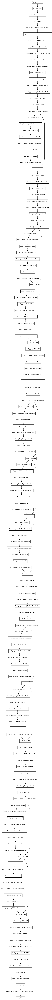

In [ ]:
keras.utils.plot_model(mnet_model)

In [ ]:
keras.utils.plot_model(nnet_model)

# MobileNet

In [ ]:
input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
mnet = MobileNetV2(weights='imagenet',include_top= False, input_tensor = input_layer)
mnet.trainable = False
output_layer = mnet.output
gap = GlobalAveragePooling2D()(output_layer)
out = Dense(30)(gap) 
mnet_model = Model(inputs=input_layer,outputs=out)



9420800/9406464 [==============================] - 0s 0us/step


In [ ]:
input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
mnet = MobileNetV2(weights='imagenet',include_top= False, input_tensor = input_layer)
mnet.trainable = True
output_layer = mnet.output
gap = GlobalAveragePooling2D()(output_layer)
out = Dense(30)(gap) 
mnet_model = Model(inputs=input_layer,outputs=out)

9420800/9406464 [==============================] - 0s 0us/step


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mnet.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_rgb, batch_size=256, validation_data=test_gen_rgb, epochs=125, callbacks=callbacks_list)

Epoch 1/125
54/54 [==============================] - 4s 28ms/step - loss: 1121.4156 - rmse: 33.4875 - val_loss: 330.4285 - val_rmse: 18.1777

Epoch 00001: val_rmse improved from inf to 18.17769, saving model to prathima_models/best_model_mnet.hdf5
Epoch 2/125
54/54 [==============================] - 1s 15ms/step - loss: 184.8167 - rmse: 13.5947 - val_loss: 117.3678 - val_rmse: 10.8336

Epoch 00002: val_rmse improved from 18.17769 to 10.83364, saving model to prathima_models/best_model_mnet.hdf5
Epoch 3/125
54/54 [==============================] - 1s 15ms/step - loss: 102.9276 - rmse: 10.1453 - val_loss: 97.2259 - val_rmse: 9.8603

Epoch 00003: val_rmse improved from 10.83364 to 9.86032, saving model to prathima_models/best_model_mnet.hdf5
Epoch 4/125
54/54 [==============================] - 1s 14ms/step - loss: 88.4104 - rmse: 9.4027 - val_loss: 87.3746 - val_rmse: 9.3474

Epoch 00004: val_rmse improved from 9.86032 to 9.34744, saving model to prathima_models/best_model_mnet.hdf5
Epoch

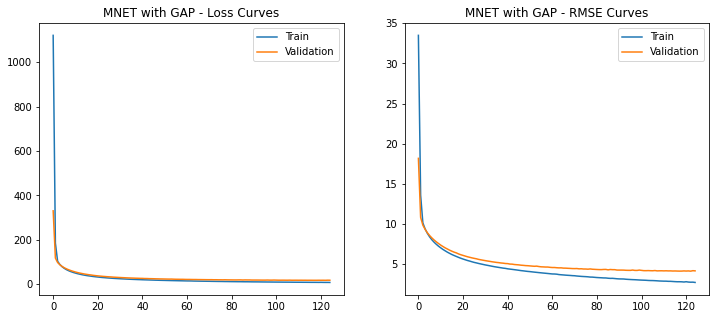

In [ ]:
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('MNET with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('MNET with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()

In [ ]:
baseline_cnn_model_ff = load_model('prathima_models/best_model_mnet.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Saved baseline model to: /tmp/tmph6ybops1.h5
9.66


#### mobilenet fine tuned - no imputation

Epoch 1/125
54/54 [==============================] - 7s 56ms/step - loss: 1212.6007 - rmse: 34.8224 - val_loss: 625.7230 - val_rmse: 25.0145

Epoch 00001: val_rmse improved from inf to 25.01446, saving model to prathima_models/best_model_mnet_tuned.hdf5
Epoch 2/125
54/54 [==============================] - 2s 40ms/step - loss: 134.9516 - rmse: 11.6169 - val_loss: 1340.7637 - val_rmse: 36.6164

Epoch 00002: val_rmse did not improve from 25.01446
Epoch 3/125
54/54 [==============================] - 2s 40ms/step - loss: 11.5737 - rmse: 3.4020 - val_loss: 1938.3180 - val_rmse: 44.0263

Epoch 00003: val_rmse did not improve from 25.01446
Epoch 4/125
54/54 [==============================] - 2s 40ms/step - loss: 8.7490 - rmse: 2.9579 - val_loss: 1870.4202 - val_rmse: 43.2484

Epoch 00004: val_rmse did not improve from 25.01446
Epoch 5/125
54/54 [==============================] - 2s 40ms/step - loss: 8.5727 - rmse: 2.9279 - val_loss: 1483.7639 - val_rmse: 38.5197

Epoch 00005: val_rmse did not 

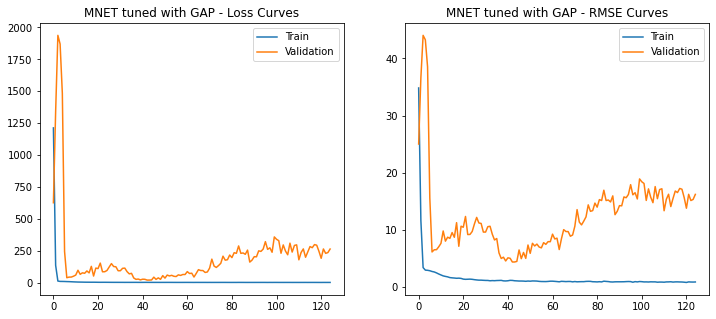

Saved baseline model to: /tmp/tmphu72mbyt.h5
9.66


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mnet_tuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_rgb, batch_size=256, validation_data=test_gen_rgb, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('MNET tuned with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('MNET tuned with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_mnet_tuned.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### mobilenet baseline forward fill

Epoch 1/125
230/230 [==============================] - 6s 19ms/step - loss: 24.8657 - rmse: 4.9866 - val_loss: 24.2612 - val_rmse: 4.9256

Epoch 00001: val_rmse improved from inf to 4.92556, saving model to prathima_models/best_model_mnet_ff.hdf5
Epoch 2/125
230/230 [==============================] - 3s 14ms/step - loss: 21.7514 - rmse: 4.6638 - val_loss: 22.6340 - val_rmse: 4.7575

Epoch 00002: val_rmse improved from 4.92556 to 4.75752, saving model to prathima_models/best_model_mnet_ff.hdf5
Epoch 3/125
230/230 [==============================] - 3s 14ms/step - loss: 20.3414 - rmse: 4.5101 - val_loss: 21.5959 - val_rmse: 4.6471

Epoch 00003: val_rmse improved from 4.75752 to 4.64714, saving model to prathima_models/best_model_mnet_ff.hdf5
Epoch 4/125
230/230 [==============================] - 3s 14ms/step - loss: 19.1496 - rmse: 4.3760 - val_loss: 21.3642 - val_rmse: 4.6221

Epoch 00004: val_rmse improved from 4.64714 to 4.62215, saving model to prathima_models/best_model_mnet_ff.hdf5


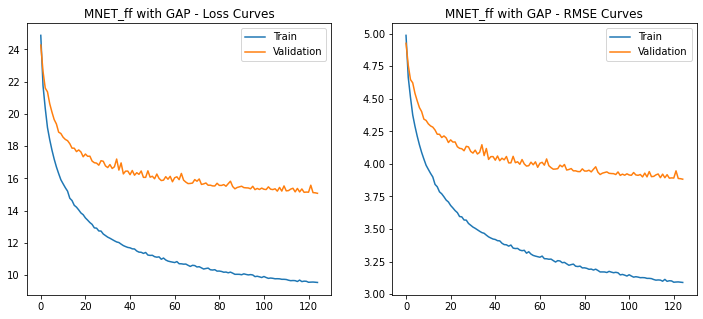

Saved baseline model to: /tmp/tmp9h9rsfhm.h5
9.66


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mnet_ff.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_ff, batch_size=256, validation_data=test_gen_ff, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('MNET_ff with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('MNET_ff with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_mnet_ff.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### mobilnet fine tuned forward fill

Epoch 1/125
230/230 [==============================] - 14s 44ms/step - loss: 315.5062 - rmse: 17.7625 - val_loss: 341.9396 - val_rmse: 18.4916

Epoch 00001: val_rmse improved from inf to 18.49161, saving model to prathima_models/best_model_mnet_ff_tuned.hdf5
Epoch 2/125
230/230 [==============================] - 9s 40ms/step - loss: 7.8262 - rmse: 2.7975 - val_loss: 1036.7814 - val_rmse: 32.1991

Epoch 00002: val_rmse did not improve from 18.49161
Epoch 3/125
230/230 [==============================] - 9s 40ms/step - loss: 6.5592 - rmse: 2.5611 - val_loss: 736.3297 - val_rmse: 27.1354

Epoch 00003: val_rmse did not improve from 18.49161
Epoch 4/125
230/230 [==============================] - 9s 39ms/step - loss: 5.3370 - rmse: 2.3102 - val_loss: 305.7824 - val_rmse: 17.4866

Epoch 00004: val_rmse improved from 18.49161 to 17.48664, saving model to prathima_models/best_model_mnet_ff_tuned.hdf5
Epoch 5/125
230/230 [==============================] - 9s 40ms/step - loss: 4.4514 - rmse: 2.109

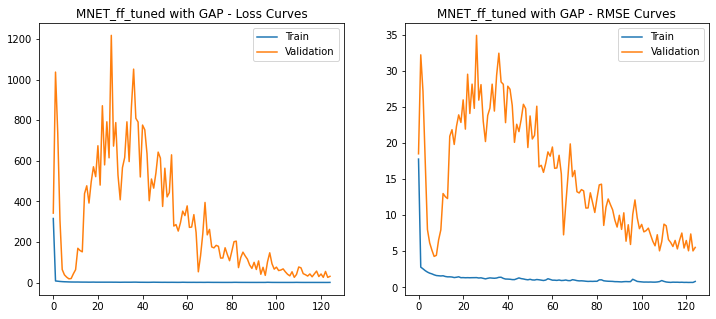

Saved baseline model to: /tmp/tmpfp8za8lj.h5
9.66


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mnet_ff_tuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_ff, batch_size=256, validation_data=test_gen_ff, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('MNET_ff_tuned with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('MNET_ff_tuned with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_mnet_ff_tuned.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### mobilenet finetuned KNN impute

Epoch 1/125
230/230 [==============================] - 14s 42ms/step - loss: 294.8714 - rmse: 17.1718 - val_loss: 402.4268 - val_rmse: 20.0606

Epoch 00001: val_rmse improved from inf to 20.06058, saving model to prathima_models/best_model_mnet_knn_tuned.hdf5
Epoch 2/125
230/230 [==============================] - 9s 40ms/step - loss: 9.3256 - rmse: 3.0538 - val_loss: 128.0350 - val_rmse: 11.3153

Epoch 00002: val_rmse improved from 20.06058 to 11.31526, saving model to prathima_models/best_model_mnet_knn_tuned.hdf5
Epoch 3/125
230/230 [==============================] - 9s 40ms/step - loss: 7.2066 - rmse: 2.6845 - val_loss: 183.6883 - val_rmse: 13.5532

Epoch 00003: val_rmse did not improve from 11.31526
Epoch 4/125
230/230 [==============================] - 9s 40ms/step - loss: 5.1702 - rmse: 2.2738 - val_loss: 336.9465 - val_rmse: 18.3561

Epoch 00004: val_rmse did not improve from 11.31526
Epoch 5/125
230/230 [==============================] - 9s 40ms/step - loss: 4.2960 - rmse: 2.07

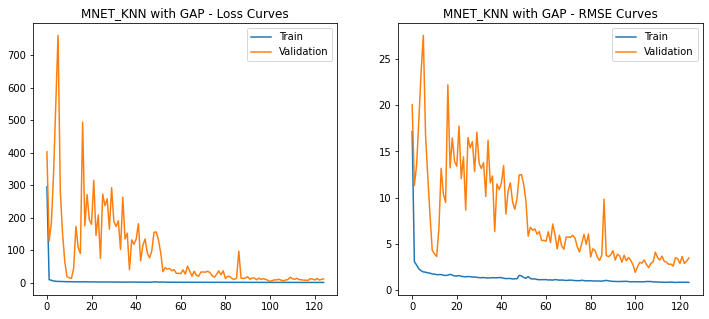

Saved baseline model to: /tmp/tmpobzjk1za.h5
9.66


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mnet_knn_tuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_knn, batch_size=256, validation_data=test_gen_knn, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('MNET_KNN with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('MNET_KNN with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_mnet_knn_tuned.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

In [ ]:
!pip install weightwatcher

     |████████████████████████████████| 41 kB 374 kB/s 
     |████████████████████████████████| 12.3 MB 8.5 MB/s 


In [ ]:

import weightwatcher as ww
import torchvision.models as models

model = models.vgg19_bn(pretrained=True)
watcher = ww.WeightWatcher(model=model)
details = watcher.analyze()
summary = watcher.get_summary(details)

#### mobilenet baseline knn impute

Epoch 1/125
230/230 [==============================] - 6s 17ms/step - loss: 13.0858 - rmse: 3.6174 - val_loss: 13.5926 - val_rmse: 3.6868

Epoch 00001: val_rmse improved from inf to 3.68681, saving model to prathima_models/best_model_mnet_knn.hdf5
Epoch 2/125
230/230 [==============================] - 3s 14ms/step - loss: 12.5658 - rmse: 3.5448 - val_loss: 13.6678 - val_rmse: 3.6970

Epoch 00002: val_rmse did not improve from 3.68681
Epoch 3/125
230/230 [==============================] - 3s 14ms/step - loss: 12.4459 - rmse: 3.5279 - val_loss: 13.6064 - val_rmse: 3.6887

Epoch 00003: val_rmse did not improve from 3.68681
Epoch 4/125
230/230 [==============================] - 3s 14ms/step - loss: 12.2896 - rmse: 3.5056 - val_loss: 13.9337 - val_rmse: 3.7328

Epoch 00004: val_rmse did not improve from 3.68681
Epoch 5/125
230/230 [==============================] - 3s 14ms/step - loss: 12.1903 - rmse: 3.4915 - val_loss: 13.8345 - val_rmse: 3.7195

Epoch 00005: val_rmse did not improve from 

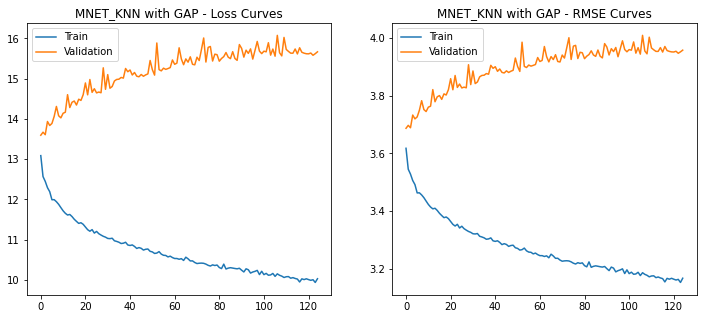

Saved baseline model to: /tmp/tmpqklqmmml.h5
9.66


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mnet_knn.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_knn, batch_size=256, validation_data=test_gen_knn, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('MNET_KNN with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('MNET_KNN with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_mnet_knn.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#  Nasnet

In [ ]:
input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
input_resize = tf.keras.layers.experimental.preprocessing.Resizing(224,224)(input_layer)
nnet = NASNetMobile(weights='imagenet',include_top= False)
nnet.trainable = True
model_nnet = nnet(input_resize)
gap = GlobalAveragePooling2D()(model_nnet)
out = Dense(30)(gap) 
nnet_model = Model(inputs=input_layer,outputs=out)

In [ ]:
input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
input_resize = tf.keras.layers.experimental.preprocessing.Resizing(224,224)(input_layer)
nnet = NASNetMobile(weights='imagenet',include_top= False)
nnet.trainable = False
model_nnet = nnet(input_resize)
gap = GlobalAveragePooling2D()(model_nnet)
out = Dense(30)(gap) 
nnet_model = Model(inputs=input_layer,outputs=out)

20004864/19993432 [==============================] - 0s 0us/step


In [ ]:
nnet_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 96, 96, 3)]       0         
_________________________________________________________________
resizing_7 (Resizing)        (None, 224, 224, 3)       0         
_________________________________________________________________
NASNet (Functional)          (None, 7, 7, 1056)        4269716   
_________________________________________________________________
global_average_pooling2d_3 ( (None, 1056)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 30)                31710     
Total params: 4,301,426
Trainable params: 31,710
Non-trainable params: 4,269,716
_________________________________________________________________


#### nasnet finetuned knn

Epoch 1/125
230/230 [==============================] - 101s 358ms/step - loss: 182.1404 - rmse: 13.4959 - val_loss: 13574.0205 - val_rmse: 116.5076

Epoch 00001: val_rmse improved from inf to 116.50758, saving model to prathima_models/best_model_nnet_knn_tuned.hdf5
Epoch 2/125
230/230 [==============================] - 79s 342ms/step - loss: 5.1134 - rmse: 2.2613 - val_loss: 2578.3994 - val_rmse: 50.7779

Epoch 00002: val_rmse improved from 116.50758 to 50.77794, saving model to prathima_models/best_model_nnet_knn_tuned.hdf5
Epoch 3/125
230/230 [==============================] - 78s 341ms/step - loss: 3.7027 - rmse: 1.9242 - val_loss: 1041.8448 - val_rmse: 32.2776

Epoch 00003: val_rmse improved from 50.77794 to 32.27763, saving model to prathima_models/best_model_nnet_knn_tuned.hdf5
Epoch 4/125
230/230 [==============================] - 79s 341ms/step - loss: 3.0751 - rmse: 1.7536 - val_loss: 949.7032 - val_rmse: 30.8173

Epoch 00004: val_rmse improved from 32.27763 to 30.81726, savin

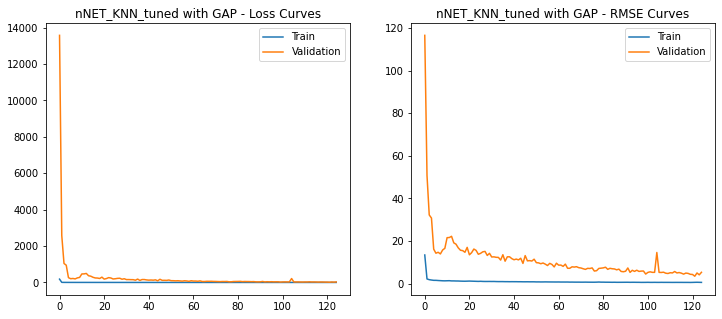

Saved baseline model to: /tmp/tmpv7nq2f_d.h5
18.47


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nnet_knn_tuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_knn, batch_size=256, validation_data=test_gen_knn, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('nNET_KNN_tuned with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('nNET_KNN_tuned with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nnet_knn_tuned.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### nasnet baseline knn

Epoch 1/125
230/230 [==============================] - 46s 91ms/step - loss: 942.0200 - rmse: 30.6923 - val_loss: 180.2908 - val_rmse: 13.4272

Epoch 00001: val_rmse improved from inf to 13.42724, saving model to prathima_models/best_model_nnet_knn.hdf5
Epoch 2/125
230/230 [==============================] - 17s 75ms/step - loss: 77.7740 - rmse: 8.8190 - val_loss: 37.6561 - val_rmse: 6.1365

Epoch 00002: val_rmse improved from 13.42724 to 6.13645, saving model to prathima_models/best_model_nnet_knn.hdf5
Epoch 3/125
230/230 [==============================] - 18s 76ms/step - loss: 32.7853 - rmse: 5.7258 - val_loss: 31.4823 - val_rmse: 5.6109

Epoch 00003: val_rmse improved from 6.13645 to 5.61091, saving model to prathima_models/best_model_nnet_knn.hdf5
Epoch 4/125
230/230 [==============================] - 17s 76ms/step - loss: 28.6493 - rmse: 5.3525 - val_loss: 28.5382 - val_rmse: 5.3421

Epoch 00004: val_rmse improved from 5.61091 to 5.34211, saving model to prathima_models/best_model_

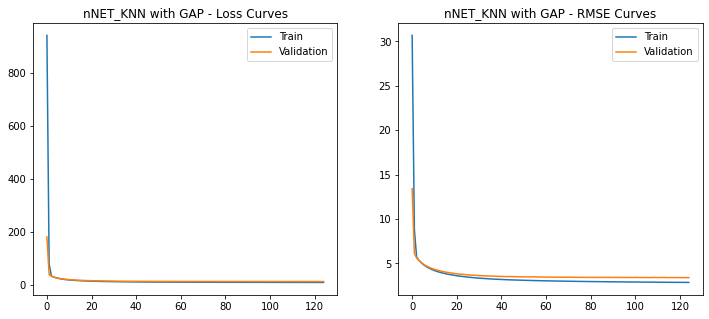

Saved baseline model to: /tmp/tmp6zq9jz3c.h5
18.48


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nnet_knn.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_knn, batch_size=256, validation_data=test_gen_knn, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('nNET_KNN with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('nNET_KNN with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nnet_knn.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### nasnet fine tuned forward fill

Epoch 1/125
230/230 [==============================] - 127s 371ms/step - loss: 183.5313 - rmse: 13.5474 - val_loss: 60871.4453 - val_rmse: 246.7214

Epoch 00001: val_rmse improved from inf to 246.72137, saving model to prathima_models/best_model_nnet_ff_tuned.hdf5
Epoch 2/125
230/230 [==============================] - 81s 352ms/step - loss: 4.8685 - rmse: 2.2065 - val_loss: 3092.8391 - val_rmse: 55.6133

Epoch 00002: val_rmse improved from 246.72137 to 55.61330, saving model to prathima_models/best_model_nnet_ff_tuned.hdf5
Epoch 3/125
230/230 [==============================] - 81s 353ms/step - loss: 3.0690 - rmse: 1.7519 - val_loss: 252.9680 - val_rmse: 15.9050

Epoch 00003: val_rmse improved from 55.61330 to 15.90497, saving model to prathima_models/best_model_nnet_ff_tuned.hdf5
Epoch 4/125
230/230 [==============================] - 81s 353ms/step - loss: 2.4683 - rmse: 1.5711 - val_loss: 32.3738 - val_rmse: 5.6898

Epoch 00004: val_rmse improved from 15.90497 to 5.68980, saving model

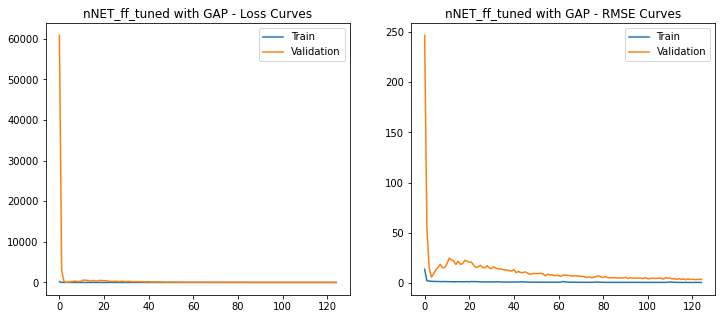

Saved baseline model to: /tmp/tmp_ocznw1m.h5
18.47


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nnet_ff_tuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_ff, batch_size=256, validation_data=test_gen_ff, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('nNET_ff_tuned with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('nNET_ff_tuned with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nnet_ff_tuned.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### nasnet baseline forward fill

Epoch 1/125
230/230 [==============================] - 33s 91ms/step - loss: 943.5593 - rmse: 30.7174 - val_loss: 187.4067 - val_rmse: 13.6897

Epoch 00001: val_rmse improved from inf to 13.68966, saving model to prathima_models/best_model_nnet_ff.hdf5
Epoch 2/125
230/230 [==============================] - 18s 77ms/step - loss: 77.3439 - rmse: 8.7945 - val_loss: 35.9008 - val_rmse: 5.9917

Epoch 00002: val_rmse improved from 13.68966 to 5.99173, saving model to prathima_models/best_model_nnet_ff.hdf5
Epoch 3/125
230/230 [==============================] - 18s 78ms/step - loss: 31.7834 - rmse: 5.6377 - val_loss: 28.2930 - val_rmse: 5.3191

Epoch 00003: val_rmse improved from 5.99173 to 5.31912, saving model to prathima_models/best_model_nnet_ff.hdf5
Epoch 4/125
230/230 [==============================] - 18s 78ms/step - loss: 27.6514 - rmse: 5.2585 - val_loss: 25.2748 - val_rmse: 5.0274

Epoch 00004: val_rmse improved from 5.31912 to 5.02741, saving model to prathima_models/best_model_nne

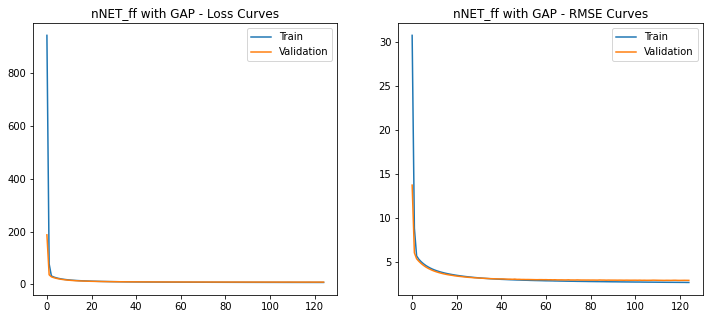

Saved baseline model to: /tmp/tmpt633adei.h5
18.48


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nnet_ff.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_ff, batch_size=256, validation_data=test_gen_ff, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('nNET_ff with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('nNET_ff with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nnet_ff.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### nasnet baseline tuned  - no impute

Epoch 1/125
54/54 [==============================] - 50s 438ms/step - loss: 735.8375 - rmse: 27.1263 - val_loss: 1503131.6250 - val_rmse: 1226.0227

Epoch 00001: val_rmse improved from inf to 1226.02271, saving model to prathima_models/best_model_nnet_tuned.hdf5
Epoch 2/125
54/54 [==============================] - 19s 352ms/step - loss: 9.9251 - rmse: 3.1504 - val_loss: 181359.8906 - val_rmse: 425.8637

Epoch 00002: val_rmse improved from 1226.02271 to 425.86371, saving model to prathima_models/best_model_nnet_tuned.hdf5
Epoch 3/125
54/54 [==============================] - 19s 353ms/step - loss: 7.8648 - rmse: 2.8044 - val_loss: 91712.6172 - val_rmse: 302.8409

Epoch 00003: val_rmse improved from 425.86371 to 302.84091, saving model to prathima_models/best_model_nnet_tuned.hdf5
Epoch 4/125
54/54 [==============================] - 19s 353ms/step - loss: 6.0916 - rmse: 2.4681 - val_loss: 57417.7109 - val_rmse: 239.6199

Epoch 00004: val_rmse improved from 302.84091 to 239.61990, saving m

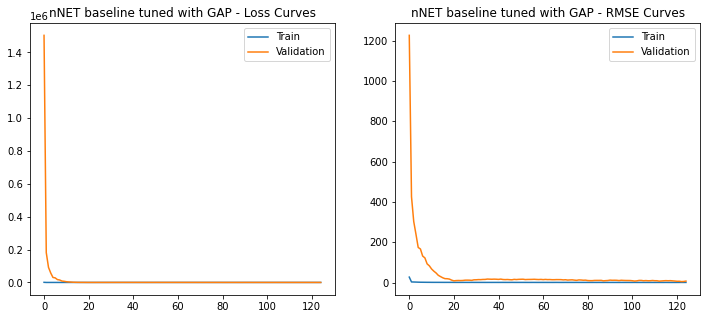

Saved baseline model to: /tmp/tmpv5irorls.h5
18.47


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nnet_tuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_rgb, batch_size=256, validation_data=test_gen_rgb, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('nNET baseline tuned with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('nNET baseline tuned with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nnet_tuned.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### nasnet baseline no impute

Epoch 1/125
54/54 [==============================] - 20s 146ms/step - loss: 2010.5111 - rmse: 44.8387 - val_loss: 1457.2065 - val_rmse: 38.1734

Epoch 00001: val_rmse improved from inf to 38.17337, saving model to prathima_models/best_model_nnet.hdf5
Epoch 2/125
54/54 [==============================] - 4s 78ms/step - loss: 1096.7856 - rmse: 33.1178 - val_loss: 782.6697 - val_rmse: 27.9762

Epoch 00002: val_rmse improved from 38.17337 to 27.97623, saving model to prathima_models/best_model_nnet.hdf5
Epoch 3/125
54/54 [==============================] - 4s 78ms/step - loss: 587.2372 - rmse: 24.2330 - val_loss: 418.6923 - val_rmse: 20.4620

Epoch 00003: val_rmse improved from 27.97623 to 20.46197, saving model to prathima_models/best_model_nnet.hdf5
Epoch 4/125
54/54 [==============================] - 4s 78ms/step - loss: 314.0992 - rmse: 17.7228 - val_loss: 226.1610 - val_rmse: 15.0386

Epoch 00004: val_rmse improved from 20.46197 to 15.03865, saving model to prathima_models/best_model_nn

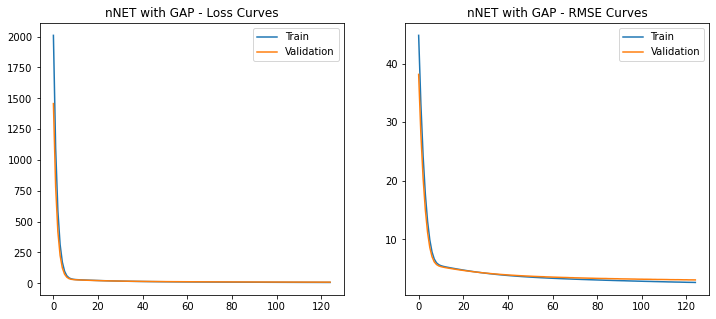

Saved baseline model to: /tmp/tmpdr06cujh.h5
18.48


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nnet.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_rgb, batch_size=256, validation_data=test_gen_rgb, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('nNET with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('nNET with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nnet.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

# Augmentation experiments

In [ ]:
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

val_split = 0.2
train_rgb_aug, val_rgb_aug, y_train_rgb_aug, y_val_rgb_aug = train_test_split(X_train_aug, y_train_aug, test_size=val_split)
image_gen_rgb_aug = ImageDataGenerator()

train_gen_aug = image_gen_rgb_aug.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(train_rgb_aug)), y_train_rgb_aug)
test_gen_aug = image_gen_rgb_aug.flow(tf.image.grayscale_to_rgb(tf.convert_to_tensor(val_rgb_aug)), y_val_rgb_aug)

In [ ]:
input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
mnet = MobileNetV2(weights='imagenet',include_top= False, input_tensor = input_layer)
mnet.trainable = True
output_layer = mnet.output
gap = GlobalAveragePooling2D()(output_layer)
out = Dense(30)(gap) 
mnet_model = Model(inputs=input_layer,outputs=out)

input_layer =tf.keras.layers.Input(shape=(96, 96, 3))
input_resize = tf.keras.layers.experimental.preprocessing.Resizing(224,224)(input_layer)
nnet = NASNetMobile(weights='imagenet',include_top= False)
nnet.trainable = True
model_nnet = nnet(input_resize)
gap = GlobalAveragePooling2D()(model_nnet)
out = Dense(30)(gap) 
nnet_model = Model(inputs=input_layer,outputs=out)

#### CNN augmenttion

Epoch 1/125
68/68 [==============================] - 16s 218ms/step - loss: 1568.7173 - rmse: 39.6070 - val_loss: 1561.8303 - val_rmse: 39.5200

Epoch 00001: val_rmse improved from inf to 39.52000, saving model to prathima_models/best_model_cnn_aug.hdf5
Epoch 2/125
68/68 [==============================] - 13s 188ms/step - loss: 88.6003 - rmse: 9.4128 - val_loss: 760.8539 - val_rmse: 27.5836

Epoch 00002: val_rmse improved from 39.52000 to 27.58358, saving model to prathima_models/best_model_cnn_aug.hdf5
Epoch 3/125
68/68 [==============================] - 13s 188ms/step - loss: 43.0935 - rmse: 6.5646 - val_loss: 67.4246 - val_rmse: 8.2112

Epoch 00003: val_rmse improved from 27.58358 to 8.21125, saving model to prathima_models/best_model_cnn_aug.hdf5
Epoch 4/125
68/68 [==============================] - 13s 186ms/step - loss: 35.6836 - rmse: 5.9736 - val_loss: 18.0196 - val_rmse: 4.2450

Epoch 00004: val_rmse improved from 8.21125 to 4.24495, saving model to prathima_models/best_model_c

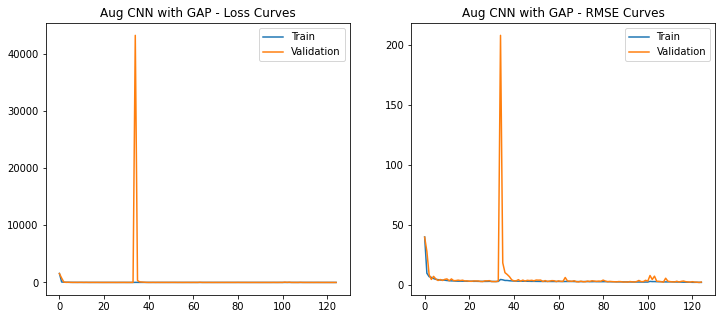

Saved baseline model to: /tmp/tmpr5yu3uz7.h5
1.0


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_cnn_aug.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train_aug, y_train_aug, batch_size=256, epochs=125, callbacks=callbacks_list, validation_split = 0.1)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('Aug CNN with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('Aug CNN with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_cnn_aug.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

##### nasnet baselin augmentation

Epoch 1/125
480/480 [==============================] - 62s 72ms/step - loss: 508.9070 - rmse: 22.5590 - val_loss: 197.1163 - val_rmse: 14.0398

Epoch 00001: val_rmse improved from inf to 14.03981, saving model to prathima_models/best_model_nasnet_aug.hdf5
Epoch 2/125
480/480 [==============================] - 30s 63ms/step - loss: 160.0163 - rmse: 12.6498 - val_loss: 142.1787 - val_rmse: 11.9239

Epoch 00002: val_rmse improved from 14.03981 to 11.92387, saving model to prathima_models/best_model_nasnet_aug.hdf5
Epoch 3/125
480/480 [==============================] - 31s 64ms/step - loss: 123.7884 - rmse: 11.1260 - val_loss: 118.4800 - val_rmse: 10.8849

Epoch 00003: val_rmse improved from 11.92387 to 10.88485, saving model to prathima_models/best_model_nasnet_aug.hdf5
Epoch 4/125
480/480 [==============================] - 30s 63ms/step - loss: 106.5712 - rmse: 10.3233 - val_loss: 106.6393 - val_rmse: 10.3266

Epoch 00004: val_rmse improved from 10.88485 to 10.32663, saving model to prat

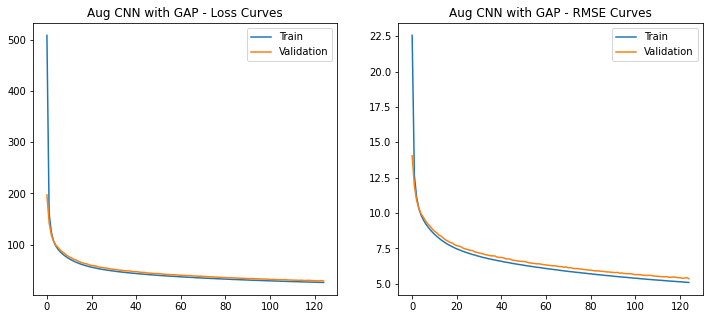

Saved baseline model to: /tmp/tmpidlqtigy.h5
18.48


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nasnet_aug.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_aug, batch_size=256, validation_data=test_gen_aug, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('Aug Nasnet with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('Aug Nasnet with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nasnet_aug.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### nasnet tuned aug

Epoch 1/125
480/480 [==============================] - 202s 367ms/step - loss: 96.9553 - rmse: 9.8466 - val_loss: 615.1448 - val_rmse: 24.8021

Epoch 00001: val_rmse improved from inf to 24.80211, saving model to prathima_models/best_model_nasnet_tuned_aug.hdf5
Epoch 2/125
480/480 [==============================] - 171s 357ms/step - loss: 7.2599 - rmse: 2.6944 - val_loss: 534.2959 - val_rmse: 23.1148

Epoch 00002: val_rmse improved from 24.80211 to 23.11484, saving model to prathima_models/best_model_nasnet_tuned_aug.hdf5
Epoch 3/125
480/480 [==============================] - 171s 357ms/step - loss: 5.7973 - rmse: 2.4078 - val_loss: 523.8979 - val_rmse: 22.8888

Epoch 00003: val_rmse improved from 23.11484 to 22.88881, saving model to prathima_models/best_model_nasnet_tuned_aug.hdf5
Epoch 4/125
480/480 [==============================] - 171s 357ms/step - loss: 4.6809 - rmse: 2.1635 - val_loss: 423.2087 - val_rmse: 20.5720

Epoch 00004: val_rmse improved from 22.88881 to 20.57204, savin

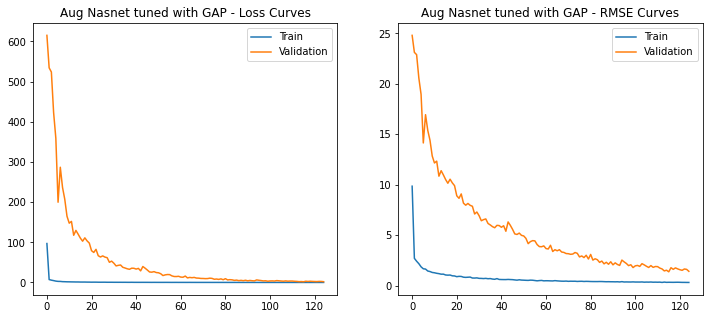

Saved baseline model to: /tmp/tmpbg7bwy9f.h5
18.47


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_nasnet_tuned_aug.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
nnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
nnet_model.fit(train_gen_aug, batch_size=256, validation_data=test_gen_aug, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(nnet_model.history.history['loss'])
plt.plot(nnet_model.history.history['val_loss'])
plt.title('Aug Nasnet tuned with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(nnet_model.history.history['rmse'])
plt.plot(nnet_model.history.history['val_rmse'])
plt.title('Aug Nasnet tuned with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_nasnet_tuned_aug.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### mobielnet tuned aug

Epoch 1/125
480/480 [==============================] - 40s 41ms/step - loss: 183.1648 - rmse: 13.5338 - val_loss: 252.4933 - val_rmse: 15.8900

Epoch 00001: val_rmse improved from inf to 15.89004, saving model to prathima_models/best_model_mobilenet_tuned_aug.hdf5
Epoch 2/125
480/480 [==============================] - 19s 40ms/step - loss: 9.7820 - rmse: 3.1276 - val_loss: 137.3804 - val_rmse: 11.7209

Epoch 00002: val_rmse improved from 15.89004 to 11.72094, saving model to prathima_models/best_model_mobilenet_tuned_aug.hdf5
Epoch 3/125
480/480 [==============================] - 19s 39ms/step - loss: 8.1405 - rmse: 2.8532 - val_loss: 41.9708 - val_rmse: 6.4785

Epoch 00003: val_rmse improved from 11.72094 to 6.47849, saving model to prathima_models/best_model_mobilenet_tuned_aug.hdf5
Epoch 4/125
480/480 [==============================] - 19s 40ms/step - loss: 7.4238 - rmse: 2.7247 - val_loss: 32.1260 - val_rmse: 5.6680

Epoch 00004: val_rmse improved from 6.47849 to 5.66798, saving mo

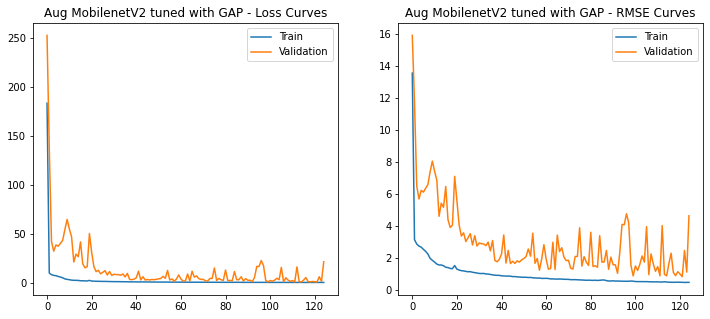

Saved baseline model to: /tmp/tmpoecn8hh8.h5
9.66


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mobilenet_tuned_aug.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_aug, batch_size=256, validation_data=test_gen_aug, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('Aug MobilenetV2 tuned with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('Aug MobilenetV2 tuned with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_mobilenet_tuned_aug.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### mobilenet baseline aug

Epoch 1/125
480/480 [==============================] - 11s 17ms/step - loss: 203.6293 - rmse: 14.2699 - val_loss: 63.3707 - val_rmse: 7.9606

Epoch 00001: val_rmse improved from inf to 7.96057, saving model to prathima_models/best_model_mobilenet_aug.hdf5
Epoch 2/125
480/480 [==============================] - 7s 14ms/step - loss: 55.0887 - rmse: 7.4222 - val_loss: 47.0064 - val_rmse: 6.8561

Epoch 00002: val_rmse improved from 7.96057 to 6.85612, saving model to prathima_models/best_model_mobilenet_aug.hdf5
Epoch 3/125
480/480 [==============================] - 7s 14ms/step - loss: 42.4103 - rmse: 6.5123 - val_loss: 37.5168 - val_rmse: 6.1251

Epoch 00003: val_rmse improved from 6.85612 to 6.12510, saving model to prathima_models/best_model_mobilenet_aug.hdf5
Epoch 4/125
480/480 [==============================] - 7s 15ms/step - loss: 35.1044 - rmse: 5.9249 - val_loss: 31.8275 - val_rmse: 5.6416

Epoch 00004: val_rmse improved from 6.12510 to 5.64159, saving model to prathima_models/bes

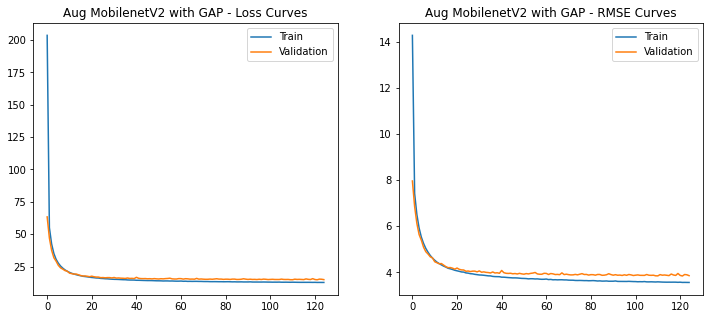

Saved baseline model to: /tmp/tmp61rlgmk7.h5
9.66


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/best_model_mobilenet_aug.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
mnet_model.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
mnet_model.fit(train_gen_aug, batch_size=256, validation_data=test_gen_aug, epochs=125, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(mnet_model.history.history['loss'])
plt.plot(mnet_model.history.history['val_loss'])
plt.title('Aug MobilenetV2 with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(mnet_model.history.history['rmse'])
plt.plot(mnet_model.history.history['val_rmse'])
plt.title('Aug MobilenetV2 with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/best_model_mobilenet_aug.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

# END OF LAZARUS

# START OF LAZARUS REPEATS

In [ ]:
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
import kerastuner as kt

In [ ]:
model_p1 = Sequential()

model_p1.add(Convolution2D(32, (3,3), padding='same', use_bias=False, input_shape=(96,96,1)))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(32, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(128, (3,3),padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(128, (3,3),padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(128, (3,3),padding='same',use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(128, (3,3),padding='same',use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())
model_p1.add(MaxPool2D(pool_size=(2, 2)))

model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())

model_p1.add(Convolution2D(64, (3,3), padding='same', use_bias=False))
model_p1.add(LeakyReLU(alpha=0.1))
model_p1.add(BatchNormalization())


model_p1.add(Flatten())
model_p1.add(Dense(512,activation='relu'))
#model_p1.add(Dropout(0.1))
model_p1.add(Dense(30))
model_p1.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 96, 96, 32)        288       
_________________________________________________________________
leaky_re_lu_30 (LeakyReLU)   (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_30 (Batc (None, 96, 96, 32)        128       
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 96, 96, 32)        9216      
_________________________________________________________________
leaky_re_lu_31 (LeakyReLU)   (None, 96, 96, 32)        0         
_________________________________________________________________
batch_normalization_31 (Batc (None, 96, 96, 32)        128       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 48, 48, 32)       

Epoch 1/400
8/8 [==============================] - 3s 240ms/step - loss: 1370.0391 - rmse: 37.0140 - val_loss: 2595.8840 - val_rmse: 50.9498

Epoch 00001: val_rmse improved from inf to 50.94982, saving model to prathima_models/prat_base_model_CNN.hdf5
Epoch 2/400
8/8 [==============================] - 1s 112ms/step - loss: 99.4552 - rmse: 9.9727 - val_loss: 2292.9600 - val_rmse: 47.8849

Epoch 00002: val_rmse improved from 50.94982 to 47.88486, saving model to prathima_models/prat_base_model_CNN.hdf5
Epoch 3/400
8/8 [==============================] - 1s 112ms/step - loss: 35.4166 - rmse: 5.9512 - val_loss: 2252.4104 - val_rmse: 47.4596

Epoch 00003: val_rmse improved from 47.88486 to 47.45957, saving model to prathima_models/prat_base_model_CNN.hdf5
Epoch 4/400
8/8 [==============================] - 1s 112ms/step - loss: 15.2210 - rmse: 3.9014 - val_loss: 2156.4578 - val_rmse: 46.4377

Epoch 00004: val_rmse improved from 47.45957 to 46.43768, saving model to prathima_models/prat_base_m

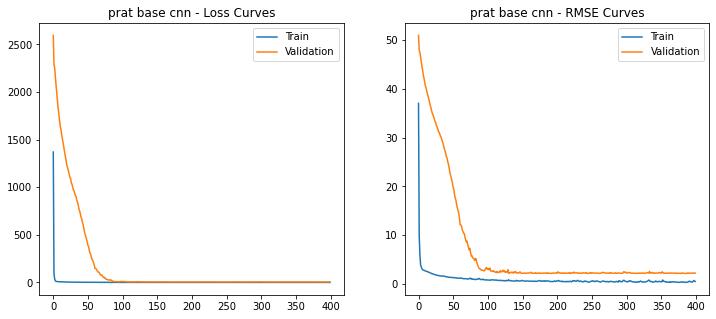

Saved baseline model to: /tmp/tmpeye5djml.h5
7.67


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_base_model_CNN.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train,y_train,batch_size=256, epochs=400, validation_split=0.10, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('prat base cnn - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('prat base cnn - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/prat_base_model_CNN.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Epoch 1/125
33/33 [==============================] - 5s 136ms/step - loss: 391.9488 - rmse: 19.7977 - val_loss: 2024.6873 - val_rmse: 44.9965

Epoch 00001: val_rmse improved from inf to 44.99652, saving model to prathima_models/prat_base_model_CNN_knn_impute.hdf5
Epoch 2/125
33/33 [==============================] - 4s 114ms/step - loss: 11.9736 - rmse: 3.4603 - val_loss: 1534.9557 - val_rmse: 39.1785

Epoch 00002: val_rmse improved from 44.99652 to 39.17851, saving model to prathima_models/prat_base_model_CNN_knn_impute.hdf5
Epoch 3/125
33/33 [==============================] - 4s 114ms/step - loss: 10.1870 - rmse: 3.1917 - val_loss: 1317.5652 - val_rmse: 36.2983

Epoch 00003: val_rmse improved from 39.17851 to 36.29828, saving model to prathima_models/prat_base_model_CNN_knn_impute.hdf5
Epoch 4/125
33/33 [==============================] - 4s 114ms/step - loss: 9.3619 - rmse: 3.0597 - val_loss: 1125.2937 - val_rmse: 33.5454

Epoch 00004: val_rmse improved from 36.29828 to 33.54540, savi

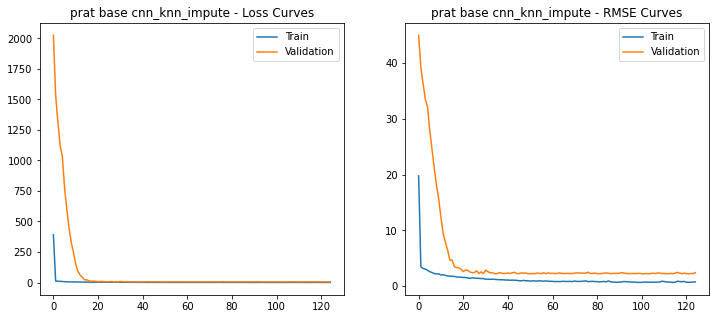

Saved baseline model to: /tmp/tmp8dol3wbg.h5
7.67


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_base_model_CNN_knn_impute.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train_knn_impute,y_train_knn_impute,batch_size=256, epochs=125, validation_split=0.10, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('prat base cnn_knn_impute - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('prat base cnn_knn_impute - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/prat_base_model_CNN_knn_impute.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)


Epoch 1/125
33/33 [==============================] - 5s 121ms/step - loss: 355.4225 - rmse: 18.8527 - val_loss: 2136.0303 - val_rmse: 46.2172

Epoch 00001: val_rmse improved from inf to 46.21721, saving model to prathima_models/prat_base_model_CNN_ff_impute.hdf5
Epoch 2/125
33/33 [==============================] - 4s 114ms/step - loss: 10.8166 - rmse: 3.2889 - val_loss: 1705.7054 - val_rmse: 41.3002

Epoch 00002: val_rmse improved from 46.21721 to 41.30019, saving model to prathima_models/prat_base_model_CNN_ff_impute.hdf5
Epoch 3/125
33/33 [==============================] - 4s 114ms/step - loss: 9.1527 - rmse: 3.0253 - val_loss: 1429.8054 - val_rmse: 37.8128

Epoch 00003: val_rmse improved from 41.30019 to 37.81277, saving model to prathima_models/prat_base_model_CNN_ff_impute.hdf5
Epoch 4/125
33/33 [==============================] - 4s 115ms/step - loss: 8.2412 - rmse: 2.8708 - val_loss: 1305.9332 - val_rmse: 36.1377

Epoch 00004: val_rmse improved from 37.81277 to 36.13770, saving m

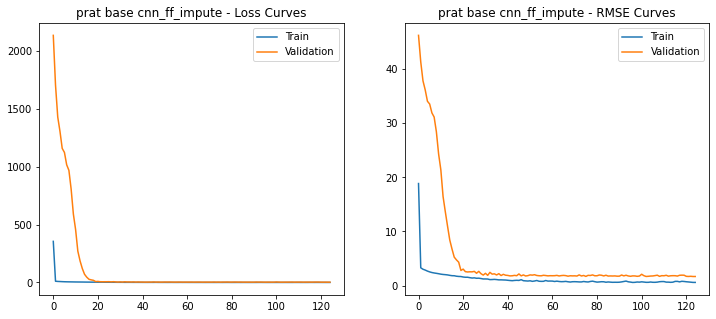

Saved baseline model to: /tmp/tmpnujrlr9n.h5
7.67


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_base_model_CNN_ff_impute.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train_ff_impute,y_train_ff_impute,batch_size=256, epochs=125, validation_split=0.10, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('prat base cnn_ff_impute - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('prat base cnn_ff_impute - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/prat_base_model_CNN_ff_impute.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Epoch 1/125
68/68 [==============================] - 10s 127ms/step - loss: 242.3538 - rmse: 15.5677 - val_loss: 1060.4958 - val_rmse: 32.5653

Epoch 00001: val_rmse improved from inf to 32.56525, saving model to prathima_models/prat_base_model_CNN_aug.hdf5
Epoch 2/125
68/68 [==============================] - 8s 116ms/step - loss: 10.7636 - rmse: 3.2808 - val_loss: 392.4572 - val_rmse: 19.8105

Epoch 00002: val_rmse improved from 32.56525 to 19.81053, saving model to prathima_models/prat_base_model_CNN_aug.hdf5
Epoch 3/125
68/68 [==============================] - 8s 116ms/step - loss: 9.6084 - rmse: 3.0997 - val_loss: 109.5564 - val_rmse: 10.4669

Epoch 00003: val_rmse improved from 19.81053 to 10.46692, saving model to prathima_models/prat_base_model_CNN_aug.hdf5
Epoch 4/125
68/68 [==============================] - 8s 116ms/step - loss: 8.6276 - rmse: 2.9373 - val_loss: 70.7580 - val_rmse: 8.4118

Epoch 00004: val_rmse improved from 10.46692 to 8.41178, saving model to prathima_models

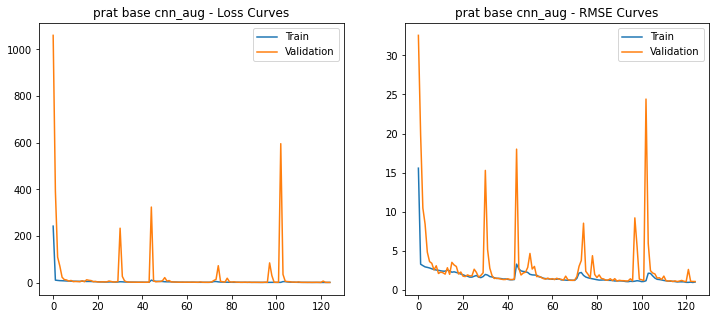

Saved baseline model to: /tmp/tmpgpopnbko.h5
7.67


In [ ]:
checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_base_model_CNN_aug.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_p1.compile(optimizer = 'adam',loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])
model_p1.fit(X_train_aug,y_train_aug,batch_size=256, epochs=125, validation_split=0.10, callbacks=callbacks_list)
plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_p1.history.history['loss'])
plt.plot(model_p1.history.history['val_loss'])
plt.title('prat base cnn_aug - Loss Curves')
plt.legend(['Train', 'Validation'])

plt.subplot(122)
plt.plot(model_p1.history.history['rmse'])
plt.plot(model_p1.history.history['val_rmse'])
plt.title('prat base cnn_aug - RMSE Curves')
plt.legend(['Train', 'Validation'])

plt.show()
baseline_cnn_model_ff = load_model('prathima_models/prat_base_model_CNN_aug.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(baseline_cnn_model_ff, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

#### keras tuned pratimas rerun

In [ ]:
def build_model(hp):
  model_p2 = Sequential([
    keras.layers.Conv2D(
        filters = hp.Int('conv_1_filter',min_value=64,max_value=96,step=16),
        kernel_size = hp.Choice('conv_1_kernel', values = [3,5]),
        activation = 'relu',
        input_shape = (96,96,1)
    ),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(
        filters = hp.Int('conv_2_filter',min_value=32,max_value=48,step=16),
        kernel_size = hp.Choice('conv_2_kernel', values = [3,5]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2)),
    keras.layers.Conv2D(
        filters = hp.Int('conv_3_filter',min_value=48,max_value=48,step=16),
        kernel_size = hp.Choice('conv_3_kernel', values = [3,5]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2)),
    keras.layers.Conv2D(
        filters = hp.Int('conv_4_filter',min_value=48,max_value=48,step=16),
        kernel_size = hp.Choice('conv_4_kernel', values = [3,5]),
        activation = 'relu'
    ),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(
        units = hp.Int('dense_1_units',min_value=48,max_value=48,step=16),
        activation = 'relu'
    ),
    keras.layers.Dense(30,activation='relu')
  ])

  model_p2.compile(optimizer = keras.optimizers.Adam(hp.Choice('learning_rate',values=[1e-2,1e-3])),loss = tf.keras.losses.mean_squared_error, metrics = [tf.keras.metrics.RootMeanSquaredError(name='rmse')])

  return model_p2

Trial 5 Complete [00h 00m 08s]
val_rmse: 9.151912689208984

Best val_rmse So Far: 5.916396617889404
Total elapsed time: 00h 00m 39s
INFO:tensorflow:Oracle triggered exit
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 92, 92, 64)        1664      
_________________________________________________________________
batch_normalization (BatchNo (None, 92, 92, 64)        256       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 88, 88, 48)        76848     
_________________________________________________________________
batch_normalization_1 (Batch (None, 88, 88, 48)        192       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 44, 44, 48)        0         
_________________________________________________________________
conv2d_2 (Conv2D) 

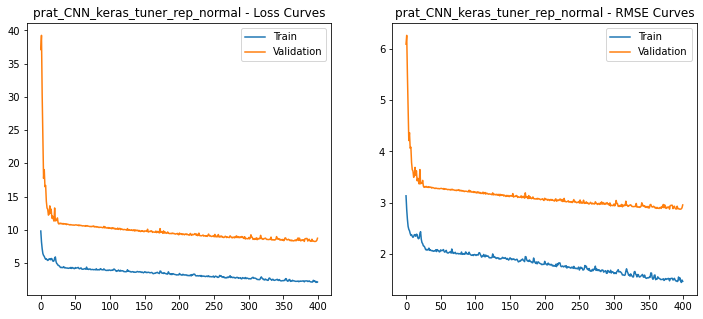

Saved baseline model to: /tmp/tmp85uzt4m5.h5
1.27


In [ ]:
objective = kt.Objective("val_rmse",direction="min")
tuner_search = RandomSearch(build_model,objective=objective,max_trials=5,directory='output',project_name='prat1')
tuner_search.search(X_train,y_train,epochs=5,validation_split=0.1)
model_SCNN = tuner_search.get_best_models(num_models=1)[0]
model_SCNN.summary()
keras.utils.plot_model(model_SCNN)

checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_best_model_simple_cnn_kerastuned.hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_SCNN.fit(X_train,y_train,batch_size=256, epochs=400, validation_split=0.10, callbacks=callbacks_list)

plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_SCNN.history.history['loss'])
plt.plot(model_SCNN.history.history['val_loss'])
plt.title('prat_CNN_keras_tuner_rep_normal - Loss Curves')
plt.legend(['Train', 'Validation'])
plt.subplot(122)
plt.plot(model_SCNN.history.history['rmse'])
plt.plot(model_SCNN.history.history['val_rmse'])
plt.title('prat_CNN_keras_tuner_rep_normal - RMSE Curves')
plt.legend(['Train', 'Validation'])
plt.show()

baseline_cnn_model_ff = load_model('prathima_models/prat_best_model_simple_cnn_kerastuned.hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(model_SCNN, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Trial 5 Complete [00h 00m 29s]
val_rmse: 20.52548599243164

Best val_rmse So Far: 2.660618543624878
Total elapsed time: 00h 02m 23s
INFO:tensorflow:Oracle triggered exit
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 92, 92, 80)        2080      
_________________________________________________________________
batch_normalization (BatchNo (None, 92, 92, 80)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 32)        23072     
_________________________________________________________________
batch_normalization_1 (Batch (None, 90, 90, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D) 

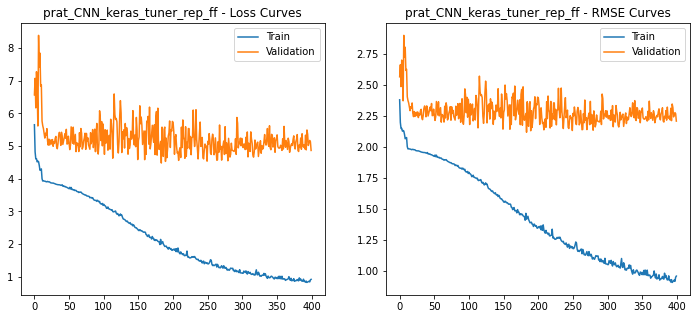

Saved baseline model to: /tmp/tmpi7390_ns.h5
1.03


In [ ]:
objective = kt.Objective("val_rmse",direction="min")
tuner_search = RandomSearch(build_model,objective=objective,max_trials=5,directory='output',project_name='prat2')
tuner_search.search(X_train_ff_impute,y_train_ff_impute,epochs=5,validation_split=0.1)
model_SCNN = tuner_search.get_best_models(num_models=1)[0]
model_SCNN.summary()
keras.utils.plot_model(model_SCNN)

checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_best_model_simple_cnn_kerastuned_ff(rpt).hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_SCNN.fit(X_train_ff_impute,y_train_ff_impute,batch_size=256, epochs=400, validation_split=0.10, callbacks=callbacks_list)

plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_SCNN.history.history['loss'])
plt.plot(model_SCNN.history.history['val_loss'])
plt.title('prat_CNN_keras_tuner_rep_ff - Loss Curves')
plt.legend(['Train', 'Validation'])
plt.subplot(122)
plt.plot(model_SCNN.history.history['rmse'])
plt.plot(model_SCNN.history.history['val_rmse'])
plt.title('prat_CNN_keras_tuner_rep_ff - RMSE Curves')
plt.legend(['Train', 'Validation'])
plt.show()

baseline_cnn_model_ff = load_model('prathima_models/prat_best_model_simple_cnn_kerastuned_ff(rpt).hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(model_SCNN, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Trial 5 Complete [00h 00m 31s]
val_rmse: 25.172630310058594

Best val_rmse So Far: 3.416707992553711
Total elapsed time: 00h 02m 33s
INFO:tensorflow:Oracle triggered exit
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 94, 94, 96)        960       
_________________________________________________________________
batch_normalization (BatchNo (None, 94, 94, 96)        384       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 48)        115248    
_________________________________________________________________
batch_normalization_1 (Batch (None, 90, 90, 48)        192       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 45, 45, 48)        0         
_________________________________________________________________
conv2d_2 (Conv2D)

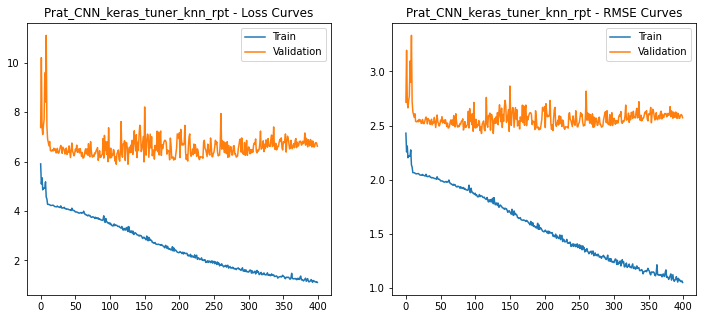

Saved baseline model to: /tmp/tmp22_3qs96.h5
1.58


In [ ]:
objective = kt.Objective("val_rmse",direction="min")
tuner_search = RandomSearch(build_model,objective=objective,max_trials=5,directory='output',project_name='prat3')
tuner_search.search(X_train_knn_impute,y_train_knn_impute,epochs=5,validation_split=0.1)
model_SCNN = tuner_search.get_best_models(num_models=1)[0]
model_SCNN.summary()
keras.utils.plot_model(model_SCNN)

checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_best_model_simple_cnn_kerastuned_knn(rpt).hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_SCNN.fit(X_train_knn_impute,y_train_knn_impute,batch_size=256, epochs=400, validation_split=0.10, callbacks=callbacks_list)

plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_SCNN.history.history['loss'])
plt.plot(model_SCNN.history.history['val_loss'])
plt.title('Prat_CNN_keras_tuner_knn_rpt - Loss Curves')
plt.legend(['Train', 'Validation'])
plt.subplot(122)
plt.plot(model_SCNN.history.history['rmse'])
plt.plot(model_SCNN.history.history['val_rmse'])
plt.title('Prat_CNN_keras_tuner_knn_rpt - RMSE Curves')
plt.legend(['Train', 'Validation'])
plt.show()

baseline_cnn_model_ff = load_model('prathima_models/prat_best_model_simple_cnn_kerastuned_knn(rpt).hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(model_SCNN, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

Trial 5 Complete [00h 00m 59s]
val_rmse: 7.542041778564453

Best val_rmse So Far: 2.6181483268737793
Total elapsed time: 00h 04m 42s
INFO:tensorflow:Oracle triggered exit
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 94, 94, 80)        800       
_________________________________________________________________
batch_normalization (BatchNo (None, 94, 94, 80)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 48)        96048     
_________________________________________________________________
batch_normalization_1 (Batch (None, 90, 90, 48)        192       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 45, 45, 48)        0         
_________________________________________________________________
conv2d_2 (Conv2D)

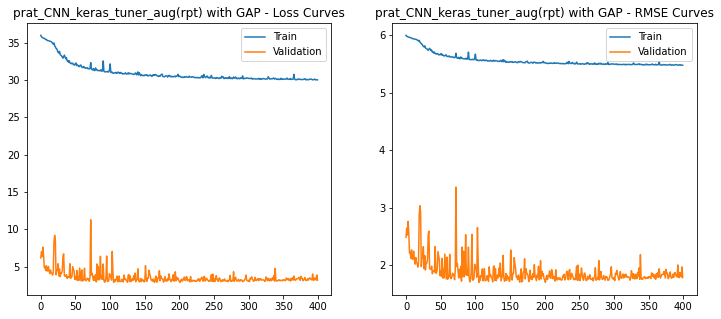

Saved baseline model to: /tmp/tmp2yaljqav.h5
1.5


In [ ]:
objective = kt.Objective("val_rmse",direction="min")
tuner_search = RandomSearch(build_model,objective=objective,max_trials=5,directory='output',project_name='prat4')
tuner_search.search(X_train_aug,y_train_aug,epochs=5,validation_split=0.1)
model_SCNN = tuner_search.get_best_models(num_models=1)[0]
model_SCNN.summary()
keras.utils.plot_model(model_SCNN)

checkpointer = ModelCheckpoint(filepath = 'prathima_models/prat_best_model_simple_cnn_kerastuned_aug(rpt).hdf5', monitor='val_rmse', verbose=1, save_best_only=True, mode='min')
decrease_lr = ReduceLROnPlateau(monitor='val_loss', patience = 5, min_lr = 0.001)
callbacks_list = [checkpointer, decrease_lr]
model_SCNN.fit(X_train_aug,y_train_aug,batch_size=256, epochs=400, validation_split=0.10, callbacks=callbacks_list)

plt.figure(figsize = (12,5))
plt.subplot(121)
plt.plot(model_SCNN.history.history['loss'])
plt.plot(model_SCNN.history.history['val_loss'])
plt.title('prat_CNN_keras_tuner_aug(rpt) with GAP - Loss Curves')
plt.legend(['Train', 'Validation'])
plt.subplot(122)
plt.plot(model_SCNN.history.history['rmse'])
plt.plot(model_SCNN.history.history['val_rmse'])
plt.title('prat_CNN_keras_tuner_aug(rpt) with GAP - RMSE Curves')
plt.legend(['Train', 'Validation'])
plt.show()

baseline_cnn_model_ff = load_model('prathima_models/prat_best_model_simple_cnn_kerastuned_aug(rpt).hdf5')
keras_file = tempfile.mktemp('.h5') # Doubt 1 -Why are we creating a temp file here again. we already have the best model saved right?
tf.keras.models.save_model(model_SCNN, keras_file, include_optimizer=False)
print('Saved baseline model to:', keras_file)
model_size = round(os.path.getsize(keras_file)/1000000,2)
print(model_size)

In [ ]:
print(len(X_test))
print(test_gen_rgb.n)

1783
428


In [ ]:
def plot_sample1(image, axis, title):
    image = image.reshape(96,96)
    axis.imshow(image, cmap='gray')
    # axis.scatter(keypoint[0::2], keypoint[1::2], marker='x', s=20)
    plt.title(title)

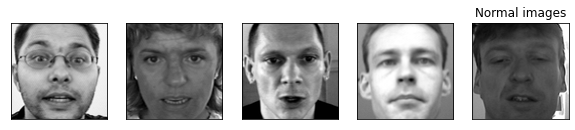

In [ ]:
# from keras.models import load_model 
import matplotlib.pyplot as plt
# CNN_manual_aug = load_model('prathima_models/best_model_cnn_aug.hdf5')
# y_preds_simpleCNN = CNN_manual_aug.predict(X_test)
fig = plt.figure(figsize=(10,5))
for i in range(5):
    axis = fig.add_subplot(1, 5, i+1, xticks=[], yticks=[])
    plot_sample1(X_test[i],axis, "")
plt.title('Normal images')
plt.show()

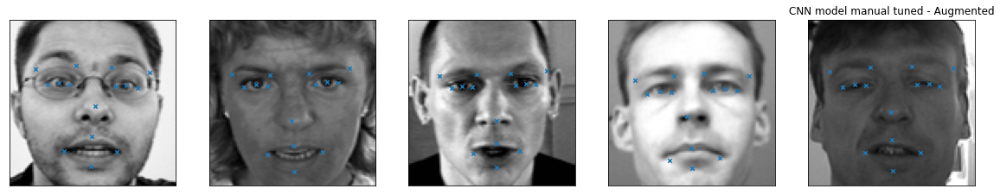

In [ ]:
from keras.models import load_model 
CNN_manual_aug = load_model('prathima_models/best_model_cnn_aug.hdf5')
y_preds_simpleCNN = CNN_manual_aug.predict(X_test)
fig = plt.figure(figsize=(20,16))
for i in range(5):
    axis = fig.add_subplot(1, 5, i+1, xticks=[], yticks=[])
    plot_sample(X_test[i], y_preds_simpleCNN[i], axis, "")
plt.title('CNN model manual tuned - Augmented')
plt.show()

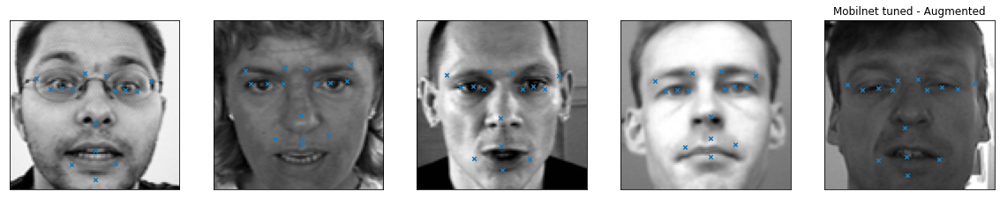

In [ ]:
from keras.models import load_model 
CNN_manual_aug = load_model('prathima_models/prathima_models/best_model_mobilenet_tuned_aug.hdf5')
y_preds_simpleCNN = CNN_manual_aug.predict(test_gen_rgb)
fig = plt.figure(figsize=(20,16))
for i in range(5):
    axis = fig.add_subplot(1, 5, i+1, xticks=[], yticks=[])
    plot_sample(X_test[i], y_preds_simpleCNN[i], axis, "")
plt.title('Mobilenet tuned - Augmented')
plt.show()

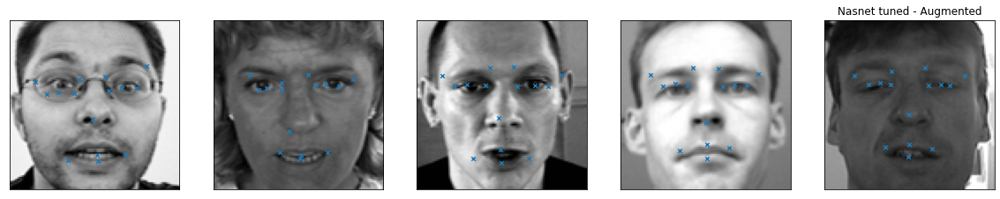

In [ ]:
from keras.models import load_model 
CNN_manual_aug = load_model('prathima_models/prathima_models/best_model_nasnet_tuned_aug.hdf5')
y_preds_simpleCNN = CNN_manual_aug.predict(test_gen_rgb)
fig = plt.figure(figsize=(20,16))
for i in range(5):
    axis = fig.add_subplot(1, 5, i+1, xticks=[], yticks=[])
    plot_sample(X_test[i], y_preds_simpleCNN[i], axis, "")
plt.title('Nasnet tuned - Augmented')
plt.show()

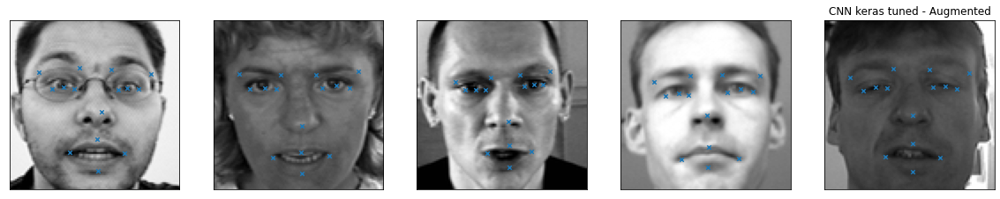

In [ ]:
from keras.models import load_model 
CNN_manual_aug = load_model('prathima_models/prathima_models/prat_best_model_simple_cnn_kerastuned_aug(rpt).hdf5')
y_preds_simpleCNN = CNN_manual_aug.predict(X_test)
fig = plt.figure(figsize=(20,16))
for i in range(5):
    axis = fig.add_subplot(1, 5, i+1, xticks=[], yticks=[])
    plot_sample(X_test[i], y_preds_simpleCNN[i], axis, "")
plt.title('CNN keras tuned - Augmented')
plt.show()

In [ ]:
# row 1
CNN_sab = load_model('prathima_models/best_model_simple_cnn.hdf5')
CNN_ff = load_model('prathima_models/best_model_simple_cnn_ff.hdf5')
CNN_knn = load_model('prathima_models/best_model_simple_cnn_knn.hdf5')
CNN_manual_aug = load_model('prathima_models/best_model_cnn_aug.hdf5')

# row2
CNN_keras = load_model('prathima_models/best_model_simple_cnn_kerastuned.hdf5')

# row_3
mnet = load_model('prathima_models/best_model_mnet.hdf5')
mnet_ff = load_model('prathima_models/best_model_mnet_ff.hdf5')
mnet_knn = load_model('prathima_models/best_model_mnet_knn.hdf5')
mnet_aug = load_model('prathima_models/prathima_models/best_model_mobilenet_aug.hdf5')

# row_4
mnet_tuned = load_model('prathima_models/best_model_mnet_tuned.hdf5')
mnet_ff_tuned = load_model('prathima_models/best_model_mnet_ff_tuned.hdf5')
mnet_knn_tuned = load_model('prathima_models/best_model_mnet_knn_tuned.hdf5')
mnet_aug_tuned = load_model('prathima_models/prathima_models/best_model_mobilenet_tuned_aug.hdf5')

# row_5
nnet = load_model('prathima_models/best_model_nnet.hdf5')
nnet_ff = load_model('prathima_models/best_model_nnet_ff.hdf5')
nnet_knn = load_model('prathima_models/best_model_nnet_knn.hdf5')
nnet_aug = load_model('prathima_models/prathima_models/best_model_nasnet_aug.hdf5')

# row_6
nnet_tuned = load_model('prathima_models/prathima_models/best_model_nnet_tuned.hdf5')
nnet_ff_tuned = load_model('prathima_models/prathima_models/best_model_nnet_ff_tuned.hdf5')
nnet_knn_tuned = load_model('prathima_models/best_model_nnet_knn_tuned.hdf5')
nnet_aug_tuned = load_model('prathima_models/prathima_models/best_model_nasnet_tuned_aug.hdf5')

# row 7
prat_CNN = load_model('prathima_models/prathima_models/prat_base_model_CNN.hdf5')
prat_CNN_ff = load_model('prathima_models/prathima_models/prat_base_model_CNN_ff_impute.hdf5')
prat_CNN_knn = load_model('prathima_models/prathima_models/prat_base_model_CNN_knn_impute.hdf5')
prat_CNN_aug = load_model('prathima_models/prathima_models/prat_base_model_CNN_aug.hdf5')

# row 8
prat_CNN_tuned = load_model('prathima_models/prathima_models/prat_best_model_simple_cnn_kerastuned.hdf5')
prat_CNN_ff_tuned = load_model('prathima_models/prathima_models/prat_best_model_simple_cnn_kerastuned_ff(rpt).hdf5')
prat_CNN_knn_tuned = load_model('prathima_models/prathima_models/prat_best_model_simple_cnn_kerastuned_knn(rpt).hdf5')
prat_CNN_aug_tuned = load_model('prathima_models/prathima_models/prat_best_model_simple_cnn_kerastuned_aug(rpt).hdf5')

In [ ]:

cnn_models = [CNN_sab , CNN_ff, CNN_knn, CNN_manual_aug, CNN_keras]

mnet_models = [mnet, mnet_ff , mnet_knn,mnet_aug]
mnet_models_tuned = [mnet_tuned, mnet_ff_tuned,mnet_knn_tuned, mnet_aug_tuned]

nnet_models = [nnet, nnet_ff,nnet_knn,nnet_aug]
nnet_models_tuned = [nnet_tuned,nnet_ff_tuned,nnet_knn_tuned,nnet_aug_tuned]

prat_cnn_models = [prat_CNN,prat_CNN_ff,prat_CNN_knn,prat_CNN_aug]
prat_cnn_models_tuned = [prat_CNN_tuned,prat_CNN_ff_tuned,prat_CNN_knn_tuned,prat_CNN_aug_tuned]


In [ ]:
import time
def inference_time(list_models, test_x, test_size, inf_size=100):
  for model in list_models:
    start = time.time()
    model.predict(test_x)
    end = time.time()
    inf = (end- start)/test_size*inf_size
    print(inf)

In [ ]:
inference_time(cnn_models,X_test, len(X_test))

1.4043620912398906
1.3367323813917125
1.3435973522038656
1.340879674580949
1.9147360251314909


In [ ]:
inference_time(prat_cnn_models, X_test, len(X_test))

1.9918042357825054
1.9757600025855218
1.9864554226030746
2.0121110802745124


In [ ]:
inference_time(prat_cnn_models_tuned, X_test, len(X_test))

2.7521563057677505
1.5252488019154837
4.190106239468611
3.587645543002708


In [ ]:
inference_time(mnet_models, test_gen_rgb, test_gen_rgb.n)

0.8973845254595035
0.8667162088590247
1.0098852286829012
0.839332999470078


In [ ]:
inference_time(mnet_models_tuned, test_gen_rgb, test_gen_rgb.n)

0.8461628004769298
0.8233041963844655
0.8285515219251687
0.8815772622545188


In [ ]:
inference_time(nnet_models, test_gen_rgb, test_gen_rgb.n)

8.46245066027775
8.40406267442436
8.178068711378863
7.876800153857079


In [ ]:
inference_time(nnet_models_tuned, test_gen_rgb, test_gen_rgb.n)

7.958094706045133
7.961660623550415
8.014991573084181
7.6870298831262325


# END OF LAZATUS REPEATS